# Kandinsky

https://habr.com/ru/companies/sberbank/articles/725282/

In [ ]:
!pip install git+https://github.com/huggingface/diffusers.git -q
!git clone https://github.com/lllyasviel/ControlNet -q
!pip install einops -q
!pip install timm -q
!pip install transformers -q
!pip install basicsr -q
!pip install accelerate -q

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.5/172.5 kB 15.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 303.0/303.0 kB 31.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 37.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 256.2/256.2 kB 27.5 MB/s eta 0:00:00


In [ ]:
import torch
torch.__version__

'2.8.0+cu126'

In [ ]:
import sys
sys.path.append('/content/ControlNet/')
from diffusers import KandinskyV22Pipeline, KandinskyV22PriorPipeline
import PIL
from torchvision import transforms
from transformers import CLIPVisionModelWithProjection
from diffusers.models import UNet2DConditionModel
import numpy as np

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


## for experiments

In [ ]:
import os, json, time, hashlib, csv
from dataclasses import dataclass, asdict
import typing
from typing import Any, Dict, Optional

# Папка для логов всех экспериментов (таблица + JSON + превью графиков)

BASE_PATH = '/content/drive/MyDrive/МУИВ/Аспирантура/Тестовый работы/for_1st_article/results'
EXPERIMENTS_DIR = f"{BASE_PATH}/_exp_logs"
os.makedirs(EXPERIMENTS_DIR, exist_ok=True)

@dataclass
class ExpConfig:
    # — контекст —
    exp_id: str
    timestamp: str
    model_name: str
    prompt: str
    seed: int
    scenario: str              # "rotate+noise", "depth", "edge", "text-only" и т.п.
    take_each: Optional[int] = None
    film_id: Optional[str] = None

    # — флаги —
    ROTE_TEXT: bool = True
    USE_PREV: bool = True
    ROTE_NEG: bool = False
    NORM_ROTED: bool = True
    FORSE_ROTE_TEXT: float = 0.3

    FORSE_R_matrix_DRIRT_LATENT: float = 0.0
    EDGE_LATENT_DRIFT: bool = False
    FORSE_EDGE_DRIRT_LATENT: float = 0.0

    DEPTH_LATENT_DRIFT: bool = False
    DEPTH_DRIFT_WITH: str = ""            # "EDGE" | "DEPTH" | "EDGE_DEPTH" | ""
    FORSE_DEPTH_DRIRT_LATENT: float = 0.0

    NORN_LATENT: bool = True

    # — размеры/счётчики —
    steps: Optional[int] = None
    height: Optional[int] = None
    width: Optional[int] = None

def make_exp_id(prompt: str, seed: int, scenario: str) -> str:
    h = hashlib.sha1(f"{prompt}|{seed}|{scenario}|{time.time()}".encode()).hexdigest()[:10]
    return f"{scenario}_{seed}_{h}"

def build_exp_config(
    prompt: str,
    seed: int,
    scenario: str,
    model_name: str,
    flags: Dict[str, Any],
    H: Optional[int]=None,
    W: Optional[int]=None,
    steps: Optional[int]=None,
    film_id: Optional[str]=None,
    take_each: Optional[int]=None,
) -> ExpConfig:
    cfg = ExpConfig(
        exp_id = make_exp_id(prompt, seed, scenario),
        timestamp = time.strftime("%Y-%m-%d %H:%M:%S"),
        model_name = model_name,
        prompt = prompt,
        seed = seed,
        scenario = scenario,
        take_each = take_each,
        film_id = film_id,
        height = H, width = W, steps = steps,
        **flags
    )
    return cfg


In [ ]:
def save_experiment_result(cfg: ExpConfig, metrics_main: Dict[str, Any], extra: Dict[str, Any]=None):
    """
    Сохраняет строку в общий CSV и полный JSON со всеми полями.
    metrics_main — то, что возвращает compare_text_vs_image_trajectories/compute_io_delta_metrics.
    extra — любые доп. поля (например, corr_lag, alpha, R2, explained_variance_deltas).
    """
    row = {**asdict(cfg)}
    if metrics_main:
        for k, v in metrics_main.items():
            # расплющим вложенные словари (p_values/debug_shapes) в плоские ключи
            if isinstance(v, dict):
                for kk, vv in v.items():
                    row[f"{k}.{kk}"] = vv
            else:
                row[k] = v
    if extra:
        for k, v in extra.items():
            row[k] = v

    # 1) CSV-таблица (append с заголовками)
    csv_path = os.path.join(EXPERIMENTS_DIR, "experiments.csv")
    write_header = (not os.path.exists(csv_path))
    with open(csv_path, "a", newline="", encoding="utf-8") as f:
        w = csv.DictWriter(f, fieldnames=list(row.keys()))
        if write_header:
            w.writeheader()
        w.writerow(row)

    # 2) JSON-детализация
    json_path = os.path.join(EXPERIMENTS_DIR, f"{cfg.exp_id}.json")
    with open(json_path, "w", encoding="utf-8") as f:
        json.dump({"config": asdict(cfg), "metrics": metrics_main, "extra": extra or {}}, f, ensure_ascii=False, indent=2)

    return {"csv": csv_path, "json": json_path}


In [ ]:
import os, json, csv, time, hashlib
from datetime import datetime
import numpy as np

# --- маленькие утилиты
def _short_hash(obj: dict, n=8):
    s = json.dumps(obj, sort_keys=True, ensure_ascii=False)
    return hashlib.md5(s.encode("utf-8")).hexdigest()[:n]

def _ensure_dir(p):
    os.makedirs(p, exist_ok=True)
    return p

def _exp_id(model_name, film_id, seed, scenario, flags:dict):
    return f"exp_{model_name}_film{film_id}_seed{seed}_{scenario}_{_short_hash(flags)}"

def _save_json(path, obj):
    with open(path, "w", encoding="utf-8") as f:
        json.dump(obj, f, ensure_ascii=False, indent=2)

def _pick_metrics(mm: dict):
    keys = ["corr_amp_pearson","linear_gain_alpha","linear_gain_R2",
            "explained_variance_deltas","mean_directional_cos","mean_directional_deg"]
    return {k: mm.get(k) for k in keys}

# --- ядро
def run_grid(experiment_matrix, experiment_fn,
             out_root="./_exp_logs", image_batch_size=8, rolling_win=2):
    """
    experiment_matrix: список словарей, каждый с полями как минимум:
        {
          "film_id": ..., "seed": ..., "scenario": "...",
          "flags": {...}, "model_name": "Kandinsky-2-2",
          "H":512, "W":512
        }
    experiment_fn(params) -> dict с ключами:
        - cfg: объект c атрибутом exp_id (или None); если None, мы построим exp_id сами
        - text_embeds_steps: list[np.ndarray]  (T,1280) после np.stack
        - gen_frames_steps:  list[PIL.Image.Image] (T)
        - edge_embeds_steps: list[np.ndarray or None] (len=T)
        - depth_embeds_steps:list[np.ndarray or None] (len=T)
        - info_frames / wide_frames / latent_frames: списки PIL (для GIF)
        - (опц.) Z_all, X_all: np.ndarray формы (T, D) — если не вернёшь, посчитаем X_all сами

    Возвращает путь к results.csv с агрегатами всех прогонов.
    """
    out_root = _ensure_dir(out_root)
    plots_dir   = _ensure_dir(os.path.join(out_root, "plots"))
    gifs_dir    = _ensure_dir(os.path.join(out_root, "gifs"))
    results_dir = _ensure_dir(os.path.join(out_root, "results"))

    csv_rows = []
    started = datetime.utcnow().isoformat() + "Z"
    print(f"[run_grid] start {started} | jobs: {len(experiment_matrix)}")

    for i, params in enumerate(experiment_matrix, 1):
        print(f"experiment_matrix: {experiment_matrix}")
        t0 = time.time()
        try:
            print(f"\n[{i}/{len(experiment_matrix)}] run: film={params.get('film_id')} seed={params.get('seed')} scen={params.get('scenario')}")
            # --- 1) запуск твоей генерации
            out = experiment_fn(params)  # <- ТВОЙ КОЛБЭК

            # --- 2) cfg/exp_id
            cfg = out.get("cfg", None)
            if cfg is None or not getattr(cfg, "exp_id", None):
                # построим exp_id сами
                exp_id = _exp_id(params.get("model_name","Kandinsky-2-2"),
                                 params.get("film_id","X"),
                                 params.get("seed","S"),
                                 params.get("scenario","sc"),
                                 params.get("flags", {}))
                class _cfg: pass
                cfg = _cfg(); cfg.exp_id = exp_id
            exp_id = cfg.exp_id

            # --- 3) собрать базовые ряды
            Z_steps = out["text_embeds_steps"]     # list of vectors
            X_imgs  = out["gen_frames_steps"]      # list of PIL
            Z_all   = out.get("Z_all", None)
            X_all   = out.get("X_all", None)

            Z_all = Z_all if Z_all is not None else np.stack([np.ravel(v).astype(np.float32) for v in Z_steps], axis=0)
            if X_all is None:
                X_all = get_clip_image_embeds(X_imgs, batch_size=image_batch_size)

            edge_steps  = out.get("edge_embeds_steps", [])
            depth_steps = out.get("depth_embeds_steps", [])
            idx_edge  = [j for j,ev in enumerate(edge_steps)  if isinstance(ev, np.ndarray)]
            idx_depth = [j for j,dv in enumerate(depth_steps) if isinstance(dv, np.ndarray)]

            # --- 4) метрики
            m_traj_TX = compare_text_vs_image_trajectories(Z_steps, X_imgs, image_batch_size=image_batch_size)
            m_io_TX   = compute_io_delta_metrics(Z_all, X_all)

            if len(idx_edge) >= 2:
                Z_edge = Z_all[idx_edge]
                E      = np.stack([edge_steps[j] for j in idx_edge], axis=0)
                m_TE   = compute_io_delta_metrics(Z_edge, E)
                X_edge = X_all[idx_edge]
                m_EC   = compute_io_delta_metrics(E, X_edge)
            else:
                m_TE = {"note":"too few EDGE steps"}
                m_EC = {"note":"too few EDGE steps"}

            if len(idx_depth) >= 2:
                Z_depth = Z_all[idx_depth]
                D       = np.stack([depth_steps[j] for j in idx_depth], axis=0)
                m_TD    = compute_io_delta_metrics(Z_depth, D)
                X_depth = X_all[idx_depth]
                m_DC    = compute_io_delta_metrics(D, X_depth)
            else:
                m_TD = {"note":"too few DEPTH steps"}
                m_DC = {"note":"too few DEPTH steps"}

            # --- 5) графики и сохранение (через готовые функции)
            series_rot = build_step_series_for_plots(Z_steps, X_imgs, image_batch_size=image_batch_size)

            fig = plot_cosine_trajectories(series_rot, title="Cosine of neighbors (text/CLIP/pixels)")
            try: save_current_figure(plots_dir, exp_id, "cosine", fig)
            except: pass

            fig = plot_delta_norms(series_rot, title="Δ-norms (text/CLIP/pixels)")
            try: save_current_figure(plots_dir, exp_id, "delta_norms", fig)
            except: pass

            fig = plot_rolling_corrs(series_rot, win=rolling_win)
            try: save_current_figure(plots_dir, exp_id, "rolling_corr", fig)
            except: pass

            fig = scatter_amp_plot(Z_all, X_all, title="‖ΔZ‖ vs ‖ΔX‖ (TEXT↔CLIP)")
            try: save_current_figure(plots_dir, exp_id, "scatter_amp_TX", fig)
            except: pass

            # универсальные диаграммы пар
            _ = plot_pair_diagnostics(Z_all, X_all, tag="TEXT-CLIP", cfg=cfg,
                                      win=rolling_win, y_mode="cos", save_dir = plots_dir)

            if len(idx_edge) >= 2:
                _ = plot_pair_diagnostics(Z_edge, E, tag="TEXT-EDGE", cfg=cfg, win=rolling_win,
                                          X_ref=X_edge, ref_label="CLIP", y_mode="angle", save_dir = plots_dir)
            if len(idx_depth) >= 2:
                _ = plot_pair_diagnostics(Z_depth, D, tag="TEXT-DEPTH", cfg=cfg, win=rolling_win,
                                          X_ref=X_depth, ref_label="CLIP", y_mode="angle", save_dir = plots_dir)

            # --- 6) GIF (единое имя по exp_id)
            info_frames   = out.get("info_frames",   [])
            wide_frames   = out.get("wide_frames",   [])
            latent_frames = out.get("latent_frames", [])

            if info_frames:
                try: make_gif(info_frames,  os.path.join(gifs_dir, f"{exp_id}_info.gif"),   duration=250, loop=0)
                except Exception as e: print("gif info skipped:", e)
            if wide_frames:
                try: make_gif(wide_frames,  os.path.join(gifs_dir, f"{exp_id}_wide.gif"),   duration=250, loop=0)
                except Exception as e: print("gif wide skipped:", e)
            if latent_frames:
                try: make_gif(latent_frames,os.path.join(gifs_dir, f"{exp_id}_latent.gif"), duration=250, loop=0)
                except Exception as e: print("gif latent skipped:", e)

            # --- 7) JSON метрик и строка в CSV
            result_json = {
                "exp_id": exp_id,
                "params": params,
                "metrics": {
                    "TEXT↔CLIP": m_io_TX,
                    "TEXT↔EDGE": m_TE,
                    "TEXT↔DEPTH":m_TD,
                    "EDGE↔CLIP": m_EC,
                    "DEPTH↔CLIP":m_DC,
                    "traj.debug": m_traj_TX.get("debug_shapes", {})
                }
            }
            _save_json(os.path.join(results_dir, f"{exp_id}.json"), result_json)

            row = {
                "exp_id": exp_id,
                "film": params.get("film_id"),
                "seed": params.get("seed"),
                "scenario": params.get("scenario"),
                "flags_hash": _short_hash(params.get("flags", {})),
                # основные метрики по парам
                **{f"TX_{k}": v for k,v in _pick_metrics(m_io_TX).items()},
                **({} if "note" in m_TE else {f"TE_{k}": v for k,v in _pick_metrics(m_TE).items()}),
                **({} if "note" in m_TD else {f"TD_{k}": v for k,v in _pick_metrics(m_TD).items()}),
                **({} if "note" in m_EC else {f"EC_{k}": v for k,v in _pick_metrics(m_EC).items()}),
                **({} if "note" in m_DC else {f"DC_{k}": v for k,v in _pick_metrics(m_DC).items()}),
            }
            csv_rows.append(row)
            dt = time.time()-t0
            print(f"[{i}] {exp_id} done in {dt:.1f}s")

        except Exception as e:
            print(f"[{i}] ERROR:", e)
            # фиксируем падение чтобы не терять сетку
            csv_rows.append({
                "exp_id": f"FAILED_{i}",
                "film": params.get("film_id"),
                "seed": params.get("seed"),
                "scenario": params.get("scenario"),
                "flags_hash": _short_hash(params.get("flags", {})),
                "error": str(e),
            })

    # --- сводный CSV
    csv_path = os.path.join(results_dir, "results.csv")
    # собираем все ключи
    fieldnames = sorted(set().union(*[r.keys() for r in csv_rows])) if csv_rows else []
    with open(csv_path, "w", newline="", encoding="utf-8") as f:
        w = csv.DictWriter(f, fieldnames=fieldnames)
        w.writeheader()
        for r in csv_rows:
            w.writerow(r)

    print(f"\n[run_grid] finished {len(experiment_matrix)} runs | csv: {csv_path}")
    return csv_path


## Kandinsky encoder

https://huggingface.co/docs/diffusers/api/pipelines/kandinsky_v22

https://github.com/huggingface/diffusers/blob/main/src/diffusers/pipelines/kandinsky2_2/pipeline_kandinsky2_2.py

In [ ]:
clip_name = 'kandinsky-community/kandinsky-2-2-prior'
TYPE_TENSORS = torch.float16

image_encoder = CLIPVisionModelWithProjection.from_pretrained(clip_name,
                                                              subfolder='image_encoder'
).to(TYPE_TENSORS).to(DEVICE)

prior_T2I = KandinskyV22PriorPipeline.from_pretrained(clip_name,
                                                      image_encoder=image_encoder,
                                                      torch_dtype=TYPE_TENSORS
).to(DEVICE)



Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


## Kandinsky decoder T2I

In [ ]:
decoder_name = 'kandinsky-community/kandinsky-2-2-decoder'

unet_T2I = UNet2DConditionModel.from_pretrained(
    decoder_name,
    subfolder='unet'
).to(TYPE_TENSORS).to(DEVICE)

decoder_T2I = KandinskyV22Pipeline.from_pretrained(
    decoder_name,
    unet=unet_T2I,
    torch_dtype=TYPE_TENSORS
).to(DEVICE)


BATCH_SIZE = 1
HEIGHT = 512
WIDTH = 512
SHAPE_NOISE = (BATCH_SIZE, unet_T2I.in_channels, HEIGHT // 8, WIDTH // 8)


Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

/tmp/ipython-input-3599163314.py:18: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  SHAPE_NOISE = (BATCH_SIZE, unet_T2I.in_channels, HEIGHT // 8, WIDTH // 8)


# Clear memory

In [ ]:
try: del unet_T2I, image_encoder
except: pass

import gc
gc.collect()
torch.cuda.empty_cache()
torch.cuda.memory_summary(device=DEVICE, abbreviated=False)

'|===========================================================================|\n|                  PyTorch CUDA memory summary, device ID 0                 |\n|---------------------------------------------------------------------------|\n|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |\n|===========================================================================|\n|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |\n|---------------------------------------------------------------------------|\n| Allocated memory      |   9392 MiB |   9392 MiB |   9392 MiB |      0 B   |\n|       from large pool |   9363 MiB |   9363 MiB |   9363 MiB |      0 B   |\n|       from small pool |     29 MiB |     29 MiB |     29 MiB |      0 B   |\n|---------------------------------------------------------------------------|\n| Active memory         |   9392 MiB |   9392 MiB |   9392 MiB |      0 B   |\n|       from large pool |   9363 MiB |   9363 MiB |

# Google Drive

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

## MOVI SHORTS

### Film и crop в массив

на основе scikit-video

In [ ]:
!pip install scikit-video -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 94.7 MB/s eta 0:00:00


In [ ]:
import skvideo.io
import cv2
import os
import numpy as np
import random
from google.colab.patches import cv2_imshow
import PIL
from IPython import display
import warnings

# Временное решение: восстановление устаревших алиасов
warnings.warn("Monkey-patching numpy: np.float/np.int/... заменены на встроенные типы!", UserWarning)
np.float = float
np.int = int
np.object = object
np.bool = bool

/tmp/ipython-input-3334568963.py:12: UserWarning: Monkey-patching numpy: np.float/np.int/... заменены на встроенные типы!
  warnings.warn("Monkey-patching numpy: np.float/np.int/... заменены на встроенные типы!", UserWarning)


In [ ]:
video_directory = '/content/drive/Othercomputers/Пресня/videos/' # your directory with move
video_list = os.listdir(video_directory)#[:2]
print(len(video_list))


54


In [ ]:
FILM_ID = 28
videodata = skvideo.io.vread(video_directory + video_list[FILM_ID])
print(videodata.shape)

name_film = video_directory + video_list[FILM_ID]
name_film = name_film.split('.')[0]
name_film = name_film.split('.')[0].split('/')[2]
print(name_film)

(220, 540, 960, 3)
drive


In [ ]:
FILM_ID = 12

# upscale frame from the bigbuckbunny sequence by a factor of 2
VIDEO_WIDTH = 1200 #1024
VIDEO_HEIGHT = 600 #512
vid = skvideo.io.vread(video_directory + video_list[FILM_ID],
                       outputdict={
                           "-sws_flags": "bilinear",
                           "-s": f"{VIDEO_WIDTH}x{VIDEO_HEIGHT}"
                       }
)
T, M, N, C = vid.shape

print("Number of frames: %d" % (T,))
print("Number of rows: %d" % (M,))
print("Number of cols: %d" % (N,))
print("Number of channels: %d" % (C,))

id_frame_1 = 10
frame_1 =   vid[id_frame_1]
cv2_imshow(frame_1[...,::-1])

In [ ]:
def get_embeddings(pil_img):
  return prior_T2I.interpolate(images_and_prompts=[pil_img],
                                 weights=[1],
                                 num_images_per_prompt=1
                                 ).image_embeds


In [ ]:
pil_img = PIL.Image.fromarray(frame_1)
clip_img_emb = get_embeddings(pil_img)
clip_img_emb.shape

  0%|          | 0/25 [00:00<?, ?it/s]

torch.Size([1, 1280])

In [ ]:
#import os
#os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "max_split_size_mb:512"

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

def getcrop_cosine_sim_frames(
              film: object,
              wait_frames:int,
              level:float = 0,
              loose_stop:int = 5,
              step_drift:int = 1,
              width_crop = 512,
              height_crop = 512,
              qty_wait = 10,
              size_dreif = 2,
              ):

    # inition
    already_selected = 0
    lose_select = 0
    current_id = 0
    (height_frane, width_frane) = film[0].shape[:2]

    # proportion between width_frane/height_frane
    coef = width_frane/height_frane


    # started crop frame parametrs
    waiting_width_dreif = 0
    waiting_height_dreif = 0
    # dreif by width
    dreif_width_center = 0
    direction_width_dreif = random.choice((-1, 0, 1))
    center_width = width_frane//2 + dreif_width_center*direction_width_dreif
    left = center_width - width_crop//2
    right = center_width + width_crop//2

    # dreif by height
    dreif_height_center = 0
    direction_height_dreif = random.choice((-1, 0, 1))
    center_height = height_frane//2 + dreif_height_center*direction_height_dreif
    down = center_height - height_crop//2
    up = center_height + height_crop//2

    # take from from film
    print('film[current_id].shape = ', film[current_id].shape)
    start_image = film[current_id][down:up, left:right, :]
    print('start_image.shape = ', start_image.shape)
    start_pil_image = PIL.Image.fromarray(start_image)
    #clip_vector_start = np.arange(768)[None]
    clip_vector_start = get_embeddings(start_pil_image).cpu().numpy()
    print('left, right = ', left,right)
    print('down, up = ', down, up)

    # append datas
    flatten_frames = [start_image.flatten()]
    emmbedings = [clip_vector_start[0]]
    original_frames = [start_pil_image]

    # update crop frame parametrs
    dreif_width_center+=size_dreif
    # if height low than width , than it wil changed slowly
    dreif_height_center+= int(size_dreif//coef)

    sim_with_start = [1]
    sim_with_earlier = [1]

    # go by frames
    for step in range(len(film)):

      waiting_width_dreif += 1
      waiting_height_dreif += 1

      if waiting_width_dreif > qty_wait:
        direction_width_dreif = random.choice((-1, 0, 1))
        waiting_width_dreif = 0

      if waiting_height_dreif > qty_wait:
        direction_height_dreif = random.choice((-1, 0, 1))
        waiting_height_dreif = 0


      if (center_width + dreif_width_center*direction_width_dreif - width_crop//2) < dreif_width_center or \
       (center_width + dreif_width_center*direction_width_dreif + width_crop//2) > width_frane-dreif_width_center:

        direction_width_dreif*=-1
        waiting_width_dreif = 0

      center_width += dreif_width_center*direction_width_dreif
      left = center_width - width_crop//2
      right = center_width + width_crop//2

      print('left, right = ', left,right)

      if (center_height + dreif_height_center*direction_height_dreif - height_crop//2) < dreif_height_center or \
       (center_height + dreif_height_center*direction_height_dreif + height_crop//2) > height_frane-dreif_height_center:

        direction_height_dreif*=-1
        waiting_height_dreif = 0

      center_height += dreif_height_center*direction_height_dreif
      down = center_height - height_crop//2
      up = center_height + height_crop//2

      print('centr w,h = ', center_width, center_height)

      print('down, up = ', down, up)

      # update id
      current_id += step_drift
      if current_id > len(film) - step_drift:
        print("The End film")
        break

      # take from from film
      print('film[current_id].shape = ', film[current_id].shape)
      current_frame  =  film[current_id][down:up, left:right, :]
      print('current_frame.shape = ', current_frame.shape)
      pil_image = PIL.Image.fromarray(current_frame)
      #clip_vector = np.arange(768)[None]
      clip_vector = get_embeddings(pil_image).cpu().numpy()


      # if try select closes by prompts
      if level:
          similirity = cosine_similarity(clip_vector,  clip_vector_start)[0][0]

      # if take all
      else: similirity = 1


      print(f'cos_similirity of step {step} = {similirity}')

      if similirity > level:
        lose_select = 0
        emmbedings.append(clip_vector[0])
        flatten_frames.append(current_frame.flatten())
        original_frames.append(pil_image)
        already_selected = len(emmbedings)
        print(f'take frame, already_selected {already_selected}')

        sim_with_start.append(similirity)
        # calculate similirity with prev
        similirity = cosine_similarity(clip_vector, emmbedings[-1][None])[0][0]
        sim_with_earlier.append(similirity)

      else: lose_select+=1
      print()
      if already_selected == wait_frames or lose_select> loose_stop: break

    del(clip_vector, current_frame, pil_image)
    gc.collect()
    torch.cuda.empty_cache()
    torch.cuda.memory_summary(device=DEVICE, abbreviated=False)

    return original_frames, emmbedings, flatten_frames, sim_with_start, sim_with_earlier

In [ ]:
import glob
import PIL
import base64
from IPython import display

def make_gif(set_dir_pil, out_name = "my_awesome.gif", duration = 10, loop=0, ext = '/*.JPG'):

    if type(set_dir_pil) == str:
       frames = [PIL.Image.open(image) for image in glob.glob(f"{set_dir_pil}{ext}")]

    elif type(set_dir_pil) == list: frames = set_dir_pil

    frame_one = frames[0]
    frame_one.save(out_name, format="GIF", append_images=frames,
               save_all=True, duration=duration, loop=loop)


def show_gif(fname):

    with open(fname, 'rb') as fd:
        b64 = base64.b64encode(fd.read()).decode('ascii')
    return display.HTML(f'<img src="data:image/gif;base64,{b64}" />')

### Get croped frames

In [ ]:
COS_SIM = 0.8
TAKE_EACH = 2
SIZE_DREIF = 1
pil_frames, img_emmbedings, flat_data, sim2start, sim2prev  = getcrop_cosine_sim_frames(
                                                                film = vid, #[55:],
                                                                level = COS_SIM,
                                                                step_drift = TAKE_EACH,
                                                                wait_frames = 25,
                                                                qty_wait = 12,   # parametr
                                                                size_dreif = SIZE_DREIF,  # parametr
                                                                width_crop = WIDTH,
                                                                height_crop = HEIGHT,
                                                                )

film[current_id].shape =  (600, 1200, 3)
start_image.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

left, right =  344 856
down, up =  44 556
left, right =  345 857
centr w,h =  601 300
down, up =  44 556
film[current_id].shape =  (600, 1200, 3)
current_frame.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

cos_similirity of step 0 = 0.9531273581835655
take frame, already_selected 2

left, right =  346 858
centr w,h =  602 300
down, up =  44 556
film[current_id].shape =  (600, 1200, 3)
current_frame.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

cos_similirity of step 1 = 0.9217363273074667
take frame, already_selected 3

left, right =  347 859
centr w,h =  603 300
down, up =  44 556
film[current_id].shape =  (600, 1200, 3)
current_frame.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

cos_similirity of step 2 = 0.9175295797584135
take frame, already_selected 4

left, right =  348 860
centr w,h =  604 300
down, up =  44 556
film[current_id].shape =  (600, 1200, 3)
current_frame.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

cos_similirity of step 3 = 0.911181609486156
take frame, already_selected 5

left, right =  349 861
centr w,h =  605 300
down, up =  44 556
film[current_id].shape =  (600, 1200, 3)
current_frame.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

cos_similirity of step 4 = 0.86553964976911
take frame, already_selected 6

left, right =  350 862
centr w,h =  606 300
down, up =  44 556
film[current_id].shape =  (600, 1200, 3)
current_frame.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

cos_similirity of step 5 = 0.8917394543065889
take frame, already_selected 7

left, right =  351 863
centr w,h =  607 300
down, up =  44 556
film[current_id].shape =  (600, 1200, 3)
current_frame.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

cos_similirity of step 6 = 0.879107232686821
take frame, already_selected 8

left, right =  352 864
centr w,h =  608 300
down, up =  44 556
film[current_id].shape =  (600, 1200, 3)
current_frame.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

cos_similirity of step 7 = 0.8693544676404931
take frame, already_selected 9

left, right =  353 865
centr w,h =  609 300
down, up =  44 556
film[current_id].shape =  (600, 1200, 3)
current_frame.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

cos_similirity of step 8 = 0.8597223549078611
take frame, already_selected 10

left, right =  354 866
centr w,h =  610 300
down, up =  44 556
film[current_id].shape =  (600, 1200, 3)
current_frame.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

cos_similirity of step 9 = 0.855887247197521
take frame, already_selected 11

left, right =  355 867
centr w,h =  611 300
down, up =  44 556
film[current_id].shape =  (600, 1200, 3)
current_frame.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

cos_similirity of step 10 = 0.8645345913825695
take frame, already_selected 12

left, right =  356 868
centr w,h =  612 300
down, up =  44 556
film[current_id].shape =  (600, 1200, 3)
current_frame.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

cos_similirity of step 11 = 0.85235147480549
take frame, already_selected 13

left, right =  355 867
centr w,h =  611 300
down, up =  44 556
film[current_id].shape =  (600, 1200, 3)
current_frame.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

cos_similirity of step 12 = 0.8561792140671769
take frame, already_selected 14

left, right =  354 866
centr w,h =  610 300
down, up =  44 556
film[current_id].shape =  (600, 1200, 3)
current_frame.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

cos_similirity of step 13 = 0.8604681287300551
take frame, already_selected 15

left, right =  353 865
centr w,h =  609 300
down, up =  44 556
film[current_id].shape =  (600, 1200, 3)
current_frame.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

cos_similirity of step 14 = 0.8423961958848388
take frame, already_selected 16

left, right =  352 864
centr w,h =  608 300
down, up =  44 556
film[current_id].shape =  (600, 1200, 3)
current_frame.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

cos_similirity of step 15 = 0.8473313551073327
take frame, already_selected 17

left, right =  351 863
centr w,h =  607 300
down, up =  44 556
film[current_id].shape =  (600, 1200, 3)
current_frame.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

cos_similirity of step 16 = 0.8593376288800161
take frame, already_selected 18

left, right =  350 862
centr w,h =  606 300
down, up =  44 556
film[current_id].shape =  (600, 1200, 3)
current_frame.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

cos_similirity of step 17 = 0.860844360575935
take frame, already_selected 19

left, right =  349 861
centr w,h =  605 300
down, up =  44 556
film[current_id].shape =  (600, 1200, 3)
current_frame.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

cos_similirity of step 18 = 0.8476055240057503
take frame, already_selected 20

left, right =  348 860
centr w,h =  604 300
down, up =  44 556
film[current_id].shape =  (600, 1200, 3)
current_frame.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

cos_similirity of step 19 = 0.8459007047040921
take frame, already_selected 21

left, right =  347 859
centr w,h =  603 300
down, up =  44 556
film[current_id].shape =  (600, 1200, 3)
current_frame.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

cos_similirity of step 20 = 0.8405885654593095
take frame, already_selected 22

left, right =  346 858
centr w,h =  602 300
down, up =  44 556
film[current_id].shape =  (600, 1200, 3)
current_frame.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

cos_similirity of step 21 = 0.8725688097322545
take frame, already_selected 23

left, right =  345 857
centr w,h =  601 300
down, up =  44 556
film[current_id].shape =  (600, 1200, 3)
current_frame.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

cos_similirity of step 22 = 0.8615971526262367
take frame, already_selected 24

left, right =  344 856
centr w,h =  600 300
down, up =  44 556
film[current_id].shape =  (600, 1200, 3)
current_frame.shape =  (512, 512, 3)


  0%|          | 0/25 [00:00<?, ?it/s]

cos_similirity of step 23 = 0.8398985915536816
take frame, already_selected 25



In [ ]:
fname = "selected.gif"
make_gif(pil_frames, out_name = fname)
show_gif(fname)

## Compare informations in vectors

### img_emmbedings

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

movi_text = {f'cadr_{i}': img_emmbedings[i] for i in range(len(img_emmbedings))}
df_text = pd.DataFrame(movi_text, columns=list(movi_text.keys()))

corr_text = df_text.corr()
corr_text.style.background_gradient(cmap='coolwarm')

,cadr_0,cadr_1,cadr_2,cadr_3,cadr_4,cadr_5,cadr_6,cadr_7,cadr_8,cadr_9,cadr_10,cadr_11,cadr_12,cadr_13,cadr_14,cadr_15,cadr_16,cadr_17,cadr_18,cadr_19,cadr_20,cadr_21,cadr_22,cadr_23,cadr_24
cadr_0,1.000000,0.953117,0.921678,0.917469,0.911125,0.865440,0.891657,0.879015,0.869255,0.859621,0.855781,0.864444,0.852246,0.856067,0.860370,0.842277,0.847214,0.859245,0.860736,0.847487,0.845788,0.840467,0.872470,0.861495,0.839790
cadr_1,0.953117,1.000000,0.975076,0.975090,0.967073,0.936364,0.949579,0.943949,0.921763,0.907850,0.922195,0.923895,0.912026,0.912508,0.921157,0.905359,0.897310,0.903813,0.906511,0.904695,0.905915,0.899522,0.920237,0.913284,0.902524
cadr_2,0.921678,0.975076,1.000000,0.983480,0.979170,0.957236,0.965614,0.959824,0.946246,0.934005,0.933271,0.940454,0.929980,0.917003,0.928183,0.911194,0.898895,0.899629,0.902064,0.894919,0.904786,0.908188,0.918871,0.910726,0.908342
cadr_3,0.917469,0.975090,0.983480,1.000000,0.986733,0.954882,0.960857,0.957990,0.932830,0.919103,0.931390,0.932289,0.920384,0.911827,0.927700,0.909041,0.896304,0.897749,0.901733,0.896114,0.905980,0.904987,0.917929,0.920282,0.913348
cadr_4,0.911125,0.967073,0.979170,0.986733,1.000000,0.963433,0.963828,0.964719,0.942624,0.929998,0.936913,0.938877,0.933078,0.923223,0.936702,0.917261,0.900758,0.900592,0.907234,0.904537,0.912706,0.914591,0.922511,0.924521,0.918447
cadr_5,0.865440,0.936364,0.957236,0.954882,0.963433,1.000000,0.978312,0.973586,0.964995,0.953561,0.956360,0.961530,0.956698,0.942942,0.946425,0.931476,0.923671,0.914192,0.915047,0.920606,0.930085,0.941017,0.942630,0.941034,0.939732
cadr_6,0.891657,0.949579,0.965614,0.960857,0.963828,0.978312,1.000000,0.983383,0.965540,0.964810,0.961226,0.966668,0.961139,0.950742,0.951097,0.929819,0.932622,0.930283,0.921190,0.921337,0.927679,0.933262,0.943125,0.940656,0.935854
cadr_7,0.879015,0.943949,0.959824,0.957990,0.964719,0.973586,0.983383,1.000000,0.967721,0.959779,0.962422,0.964624,0.962931,0.942926,0.945604,0.930711,0.933103,0.928019,0.924432,0.921416,0.926294,0.936588,0.943156,0.946094,0.942310
cadr_8,0.869255,0.921763,0.946246,0.932830,0.942624,0.964995,0.965540,0.967721,1.000000,0.977669,0.949817,0.967138,0.967454,0.931190,0.927494,0.916607,0.922447,0.911907,0.912112,0.907735,0.915037,0.928056,0.934933,0.925691,0.927116
cadr_9,0.859621,0.907850,0.934005,0.919103,0.929998,0.953561,0.964810,0.959779,0.977669,1.000000,0.957319,0.970927,0.964826,0.950147,0.934468,0.920195,0.933518,0.930011,0.921213,0.916935,0.919539,0.929607,0.931329,0.922166,0.922744


### pixels movi_frame

In [ ]:
movi_frame = {f'cadr_{i}': flat_data[i] for i in range(len(flat_data))}
df_frame = pd.DataFrame(movi_frame, columns=list(movi_frame.keys()))

corr_frame = df_frame.corr()
corr_frame.style.background_gradient(cmap='coolwarm')

,cadr_0,cadr_1,cadr_2,cadr_3,cadr_4,cadr_5,cadr_6,cadr_7,cadr_8,cadr_9,cadr_10,cadr_11,cadr_12,cadr_13,cadr_14,cadr_15,cadr_16,cadr_17,cadr_18,cadr_19,cadr_20,cadr_21,cadr_22,cadr_23,cadr_24
cadr_0,1.000000,0.948840,0.922236,0.903688,0.882761,0.862763,0.855838,0.850698,0.841148,0.845913,0.849623,0.869624,0.875255,0.863286,0.856546,0.855194,0.853789,0.854966,0.855763,0.858207,0.859814,0.861134,0.859907,0.864921,0.860694
cadr_1,0.948840,1.000000,0.945647,0.927512,0.905439,0.883298,0.872251,0.865527,0.855403,0.861546,0.869130,0.889113,0.889970,0.874326,0.861867,0.859738,0.858900,0.860200,0.861504,0.863903,0.864348,0.865546,0.863264,0.868085,0.863387
cadr_2,0.922236,0.945647,1.000000,0.964773,0.938216,0.913603,0.900758,0.892216,0.882363,0.886632,0.893172,0.909081,0.899429,0.864497,0.851480,0.846873,0.844851,0.845574,0.847875,0.849257,0.849142,0.851102,0.849508,0.851166,0.845891
cadr_3,0.903688,0.927512,0.964773,1.000000,0.966510,0.932598,0.917629,0.908179,0.896267,0.899238,0.903894,0.911820,0.896360,0.858786,0.843078,0.836980,0.838130,0.838145,0.838391,0.840718,0.840356,0.843195,0.840693,0.842276,0.835173
cadr_4,0.882761,0.905439,0.938216,0.966510,1.000000,0.952614,0.935642,0.921603,0.911069,0.909820,0.910874,0.906638,0.890469,0.848831,0.831342,0.828678,0.832050,0.833912,0.832895,0.834239,0.833778,0.836709,0.834559,0.835247,0.826977
cadr_5,0.862763,0.883298,0.913603,0.932598,0.952614,1.000000,0.960086,0.939138,0.923727,0.921217,0.919231,0.899440,0.879976,0.836683,0.825227,0.826326,0.829499,0.830678,0.829122,0.829882,0.827737,0.829581,0.827763,0.828611,0.823178
cadr_6,0.855838,0.872251,0.900758,0.917629,0.935642,0.960086,1.000000,0.961825,0.940652,0.929754,0.919940,0.894062,0.875700,0.835987,0.822986,0.823352,0.827337,0.826467,0.822215,0.820723,0.818103,0.819062,0.817023,0.818640,0.814777
cadr_7,0.850698,0.865527,0.892216,0.908179,0.921603,0.939138,0.961825,1.000000,0.956541,0.948730,0.935325,0.897682,0.870016,0.837816,0.827801,0.823292,0.825190,0.825720,0.820265,0.817794,0.814230,0.815434,0.813643,0.816165,0.812278
cadr_8,0.841148,0.855403,0.882363,0.896267,0.911069,0.923727,0.940652,0.956541,1.000000,0.968043,0.944156,0.902118,0.873973,0.843584,0.830352,0.823768,0.825457,0.823421,0.817672,0.817589,0.817749,0.819480,0.819183,0.821482,0.818192
cadr_9,0.845913,0.861546,0.886632,0.899238,0.909820,0.921217,0.929754,0.948730,0.968043,1.000000,0.963017,0.916901,0.883310,0.845686,0.833239,0.828620,0.830112,0.828645,0.823662,0.822695,0.820959,0.821468,0.820109,0.823447,0.820369


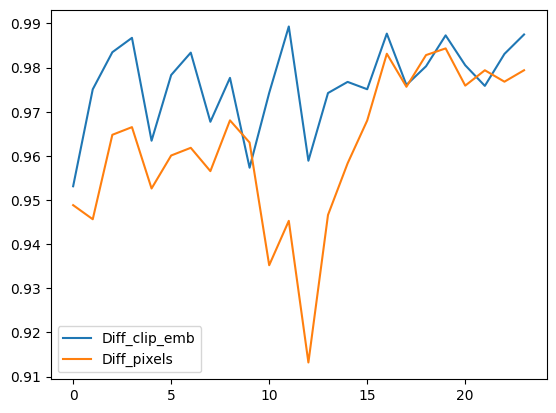

In [ ]:
plt.plot(np.arange(len(img_emmbedings)-1), [corr_text.iloc[i,i+1] for i in range(len(corr_text)-1)], label = 'Diff_clip_emb')
plt.plot(np.arange(len(flat_data)-1), [corr_frame.iloc[i,i+1] for i in range(len(corr_frame)-1)], label = 'Diff_pixels')
plt.legend()
plt.show()

# Rotation matrix and compute step embeddings functions

In [ ]:
def get_start_embegings(prompt, negative, num_steps_inf, seed):
    prompt_emb = prior_T2I(prompt=prompt,
                           num_inference_steps=num_steps_inf,
                           num_images_per_prompt=1,
                           generator=torch.manual_seed(seed)
                           ).image_embeds.detach().cpu().numpy().astype(np.float32)

    negative_emb = prior_T2I(prompt=negative,
                             num_inference_steps=num_steps_inf,
                             num_images_per_prompt=1,
                             generator=torch.manual_seed(seed)
                             ).image_embeds.detach().cpu().numpy().astype(np.float32)

    return unit_vector(prompt_emb), unit_vector(negative_emb)


def compute_embed(emb_prev: np.ndarray, r_matrix: np.ndarray) -> np.ndarray:
    """Применить поворот к эмбеддингу."""
    return emb_prev @ r_matrix


def unit_vector(v, eps: float = 1e-12):
    v = np.asarray(v, dtype=np.float32)
    n = np.linalg.norm(v)
    return v if n < eps else (v / n)

def angle(vector1, vector2):
    """ Returns the angle in radians between given vectors"""
    v1_u = unit_vector(vector1)
    v2_u = unit_vector(vector2)
    minor = np.linalg.det(
        np.stack((v1_u[-2:], v2_u[-2:]))
    )
    if minor == 0:
        raise NotImplementedError('Too odd vectors =(')
    return np.sign(minor) * np.arccos(np.clip(np.dot(v1_u, v2_u), -1.0, 1.0))


def get_R_martix(vec_1, vec_2):
  # https://analyticphysics.com/Higher%20Dimensions/Rotations%20in%20Higher%20Dimensions.htm
  # Gram-Schmidt orthogonalization

  a = angle(vec_1, vec_2)

  n1 = unit_vector(vec_1)
  vec_2 = vec_2 - np.dot(n1, vec_2) * n1
  n2 = unit_vector(vec_2)


  I = np.identity(vec_1.shape[0])
  R = I + (np.outer(n2,n1) - np.outer(n1,n2)) * np.sin(a) + \
   ( np.outer(n1,n1) + np.outer(n2,n2)) * (np.cos(a)-1)

  return R

def slerp(u, v, t: float, eps: float = 1e-7):
    u = unit_vector(u, eps); v = unit_vector(v, eps)
    dot = float(np.clip(np.dot(u, v), -1.0, 1.0))
    theta = np.arccos(dot)
    if theta < 1e-6:
        return unit_vector((1.0 - t) * u + t * v, eps).astype(np.float32)
    sin_t = np.sin(theta)
    a = np.sin((1.0 - t) * theta) / sin_t
    b = np.sin(t * theta) / sin_t
    return unit_vector(a * u + b * v, eps).astype(np.float32)

def get_next_embegings(base_embegings,
                       r_matrix,
                       force: float = 1.0,       # сила поворота
                       rote_negative: bool = False,
                       norm_roted: bool = True):
    # --- запоминаем исходные формы
    p0 = np.asarray(base_embegings[0], dtype=np.float32)
    n0 = np.asarray(base_embegings[1], dtype=np.float32)
    p_shape = p0.shape   # обычно (1, 1280)
    n_shape = n0.shape

    # работаем в векторном виде (D,)
    p0v   = p0.reshape(-1)
    p_rot = compute_embed(p0v, r_matrix).reshape(-1)
    p_next = slerp(p0v, p_rot, float(force))
    if norm_roted: p_next = unit_vector(p_next)
    # возвращаем исходную форму
    p_next = p_next.reshape(p_shape).astype(np.float32)

    if rote_negative:
        n0v   = n0.reshape(-1)
        n_rot = compute_embed(n0v, r_matrix).reshape(-1)
        n_next = slerp(n0v, n_rot, float(force))
        if norm_roted: n_next = unit_vector(n_next)
        n_next = n_next.reshape(n_shape).astype(np.float32)
    else:
        n_next = n0.astype(np.float32)

    return [p_next, n_next]

In [ ]:
def get_start_embegings(prompt, negative, num_steps_inf, seed):
    prompt_emb = prior_T2I(prompt=prompt,
                           num_inference_steps=num_steps_inf,
                           num_images_per_prompt=1,
                           generator=torch.manual_seed(seed)
                           ).image_embeds.detach().cpu().numpy().astype(np.float32)

    negative_emb = prior_T2I(prompt=negative,
                             num_inference_steps=num_steps_inf,
                             num_images_per_prompt=1,
                             generator=torch.manual_seed(seed)
                             ).image_embeds.detach().cpu().numpy().astype(np.float32)

    return unit_vector(prompt_emb), unit_vector(negative_emb)


def compute_embed(emb_prev: np.ndarray, r_matrix: np.ndarray) -> np.ndarray:
    """Применить поворот к эмбеддингу."""
    return emb_prev @ r_matrix


import numpy as np

def unit_vector(v, eps: float = 1e-12):
    v = np.asarray(v, dtype=np.float32)
    n = np.linalg.norm(v)
    return v if n < eps else (v / n)

def angle_between(u: np.ndarray, v: np.ndarray, eps: float = 1e-12) -> float:
    """Угол [0, π] между u и v по косинусу (без знака — для R это достаточно)."""
    u = unit_vector(u, eps); v = unit_vector(v, eps)
    cos_t = float(np.clip(np.dot(u, v), -1.0, 1.0))
    return float(np.arccos(cos_t))

def get_R_martix(vec_1: np.ndarray, vec_2: np.ndarray, eps: float = 1e-8) -> np.ndarray:
    """
    Поворот в N-мерии в плоскости span{n1, n2} (Gram–Schmidt).
    Возвращает ортогональную R (N×N). Если векторы коллинеарны — R≈I.
    """
    v1 = np.asarray(vec_1, dtype=np.float32).reshape(-1)
    v2 = np.asarray(vec_2, dtype=np.float32).reshape(-1)
    N  = v1.shape[0]

    n1 = unit_vector(v1, eps)
    # компонент vec_2, ортогональный n1
    v2_perp = v2 - np.dot(n1, v2) * n1
    n2_norm = np.linalg.norm(v2_perp)

    if n2_norm < eps:
        # коллинеарные/антиколлинеарные — поворот неопределён, берём Identity
        return np.eye(N, dtype=np.float32)

    n2 = (v2_perp / n2_norm).astype(np.float32)

    theta = angle_between(v1, v2)  # [0, π]
    I = np.eye(N, dtype=np.float32)
    outer_12 = np.outer(n2, n1)
    outer_21 = np.outer(n1, n2)
    outer_11 = np.outer(n1, n1)
    outer_22 = np.outer(n2, n2)

    R = I + (outer_12 - outer_21) * np.sin(theta) + (outer_11 + outer_22) * (np.cos(theta) - 1.0)
    return R.astype(np.float32)

def slerp(u: np.ndarray, v: np.ndarray, t: float, eps: float = 1e-7) -> np.ndarray:
    """
    Сферическая интерполяция: t∈[0,1] — часть дуги, t>1 — экстраполяция.
    Для малых углов — LERP + нормализация.
    """
    u = unit_vector(u, eps); v = unit_vector(v, eps)
    dot = float(np.clip(np.dot(u, v), -1.0, 1.0))
    theta = np.arccos(dot)

    if theta < 1e-6:
        return unit_vector((1.0 - t) * u + t * v, eps).astype(np.float32)

    sin_t = np.sin(theta)
    a = np.sin((1.0 - t) * theta) / sin_t
    b = np.sin(t * theta) / sin_t
    w = a * u + b * v
    return unit_vector(w, eps).astype(np.float32)

def compute_embed(emb_prev: np.ndarray, r_matrix: np.ndarray) -> np.ndarray:
    return emb_prev @ r_matrix

def get_next_embegings(base_embegings,
                       r_matrix: np.ndarray,
                       force: float = 1.0,        # ← сила поворота
                       rote_negative: bool = False,
                       norm_roted: bool = True):
    """
    Применяем R к базовому эмбеддингу и делаем SLERP(base, R·base, force).
    ВАЖНО: возвращаем исходные формы (например, (1, 1280)), чтобы не ломать батч-дим.
    """
    p0 = np.asarray(base_embegings[0], dtype=np.float32)
    n0 = np.asarray(base_embegings[1], dtype=np.float32)
    p_shape = p0.shape
    n_shape = n0.shape

    # работаем в векторном виде
    p0v   = p0.reshape(-1)
    p_rot = compute_embed(p0v, r_matrix).reshape(-1)
    p_next = slerp(p0v, p_rot, float(force))
    if norm_roted: p_next = unit_vector(p_next)
    p_next = p_next.reshape(p_shape).astype(np.float32)

    if rote_negative:
        n0v   = n0.reshape(-1)
        n_rot = compute_embed(n0v, r_matrix).reshape(-1)
        n_next = slerp(n0v, n_rot, float(force))
        if norm_roted: n_next = unit_vector(n_next)
        n_next = n_next.reshape(n_shape).astype(np.float32)
    else:
        n_next = n0.astype(np.float32)

    return [p_next, n_next]


In [ ]:
k = 1
d = 3
vec_1 = img_emmbedings[k].astype(np.float32)
vec_2 = img_emmbedings[k+d].astype(np.float32)

res = get_R_martix(vec_1,
                   vec_2
                   )
np.linalg.norm(np.matmul(res, vec_1) - vec_2)/np.linalg.norm(vec_2)

np.float32(0.020743357)

# Additionl functions and models

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

def pil_to_tensor(im):
    return torch.tensor(np.array(im.convert('RGB'))).permute(2, 0, 1).unsqueeze(0)/255.0

def tensor_to_pil(tensor_im):
    tensor_im = tensor_im.squeeze(0) # In case there is a batch dimension
    tensor_im = tensor_im.permute(1, 2, 0).detach().cpu() # Rearrange
    tensor_im = tensor_im.clip(0, 1)*255 # Note that we clip to (0, 1)
    im_array = np.array(tensor_im).astype(np.uint8) # To numpy and int8
    im = PIL.Image.fromarray(im_array) # To PIL
    return im

def tensor_to_numpy(tensor_im):
    tensor_im = tensor_im.squeeze(0) # In case there is a batch dimension
    tensor_im = tensor_im.permute(1, 2, 0).detach().cpu() # Rearrange
    tensor_im = tensor_im.clip(0, 1)*255 # Note that we clip to (0, 1)
    return np.array(tensor_im)

def numpy_to_tensor(array):
    return torch.tensor(array).permute(2, 0, 1).unsqueeze(0)

def lat2edge(tenz, cannels = 3, get_ten = True):
    massiv = tensor_to_numpy(tenz).astype(np.uint8)
    canny = cv2.Canny(massiv, 100, 200)
    canny = canny[:, :, None]

    canny = np.concatenate([canny for _ in range(cannels)], axis=2)
    if get_ten: return numpy_to_tensor(canny)/255.
    else: return canny/255.


class PixelGenerator(nn.Module):
  """A tensor of shape [1, 3, size, size] to represent an image"""
  def __init__(self, shape_noise,  seed, dtype, init_image=None):
    super(PixelGenerator, self).__init__()
    self.seed = seed
    self.generator = torch.manual_seed(self.seed)  # Seed generator чтобы создать начальный скрытый шума
    self.im_array = nn.Parameter(torch.randn(shape_noise,
                                             generator=self.generator,
                                             dtype=dtype
                                             ))
    if init_image:
      self.im_array = nn.Parameter(pil_to_tensor(init_image.convert('RGB').resize((shape_noise[2],
                                                                                   shape_noise[3]))))

  def forward(self):
    return self.im_array



### VAE

In [ ]:
from diffusers import AutoencoderKL

VAE = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae").to(DEVICE)

In [ ]:
def encode_vae(img):
    with torch.no_grad():
        diag_gaussian_distrib_obj = VAE.encode(img, return_dict=False)
        img_latent = diag_gaussian_distrib_obj[0].sample().detach().cpu()
        img_latent *= 0.18215
    return img_latent


def decode_latents(latents):
    latents = 1 / 0.18215 * latents
    latents = latents.to(VAE.device)

    with torch.no_grad():
        images = VAE.decode(latents)['sample']
    images = (images / 2 + 0.5).clamp(0, 1)
    images = images.detach().cpu().permute(0, 2, 3, 1).numpy()
    images = (images * 255).round().astype('uint8')
    pil_images = [PIL.Image.fromarray(image) for image in images]
    return pil_images

### Depth model Midas to latent

In [ ]:
!pip install timm -q

Load a model (see [https://github.com/intel-isl/MiDaS/#Accuracy](https://github.com/intel-isl/MiDaS/#Accuracy) for an overview)

In [ ]:
#model_type = "DPT_Large"     # MiDaS v3 - Large     (highest accuracy, slowest inference speed)
model_type = "DPT_Hybrid"   # MiDaS v3 - Hybrid    (medium accuracy, medium inference speed)
#model_type = "MiDaS_small"  # MiDaS v2.1 - Small   (lowest accuracy, highest inference speed)

midas = torch.hub.load("intel-isl/MiDaS", model_type)
midas.to(DEVICE)
midas.eval()

Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master
/usr/local/lib/python3.12/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/usr/local/lib/python3.12/dist-packages/timm/models/_factory.py:138: UserWarning: Mapping deprecated model name vit_base_resnet50_384 to current vit_base_r50_s16_384.orig_in21k_ft_in1k.
  model = create_fn(


DPTDepthModel(
  (pretrained): Module(
    (model): VisionTransformer(
      (patch_embed): HybridEmbed(
        (backbone): ResNetV2(
          (stem): Sequential(
            (conv): StdConv2dSame(3, 64, kernel_size=(7, 7), stride=(2, 2), bias=False)
            (norm): GroupNormAct(
              32, 64, eps=1e-05, affine=True
              (drop): Identity()
              (act): ReLU(inplace=True)
            )
            (pool): MaxPool2dSame(kernel_size=(3, 3), stride=(2, 2), padding=(0, 0), dilation=(1, 1), ceil_mode=False)
          )
          (stages): Sequential(
            (0): ResNetStage(
              (blocks): Sequential(
                (0): Bottleneck(
                  (downsample): DownsampleConv(
                    (conv): StdConv2dSame(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
                    (norm): GroupNormAct(
                      32, 256, eps=1e-05, affine=True
                      (drop): Identity()
                      (act): Identit

Load transforms to resize and normalize the image for large or small model

In [ ]:
midas_transforms = torch.hub.load("intel-isl/MiDaS", "transforms")

if model_type == "DPT_Large" or model_type == "DPT_Hybrid":
    transform = midas_transforms.dpt_transform
else:
    transform = midas_transforms.small_transform

Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master


# Load fonts for descriptions

In [ ]:
import matplotlib
import copy
import textwrap

system_fonts = matplotlib.font_manager.findSystemFonts(fontpaths=None, fontext='ttf')
FONT_TITLE = PIL.ImageFont.truetype('/usr/share/fonts/truetype/liberation/LiberationSans-Bold.ttf', 15)
FONT_ADD = PIL.ImageFont.truetype('/usr/share/fonts/truetype/liberation/LiberationSerif-Bold.ttf', 13)
system_fonts

['/usr/share/fonts/truetype/liberation/LiberationSerif-Bold.ttf',
 '/usr/share/fonts/truetype/liberation/LiberationMono-BoldItalic.ttf',
 '/usr/share/fonts/truetype/liberation/LiberationSerif-Regular.ttf',
 '/usr/share/fonts/truetype/liberation/LiberationSans-Italic.ttf',
 '/usr/share/fonts/truetype/liberation/LiberationSans-BoldItalic.ttf',
 '/usr/share/fonts/truetype/liberation/LiberationSansNarrow-BoldItalic.ttf',
 '/usr/share/fonts/truetype/liberation/LiberationMono-Bold.ttf',
 '/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Italic.ttf',
 '/usr/share/fonts/truetype/liberation/LiberationSans-Bold.ttf',
 '/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf',
 '/usr/share/fonts/truetype/humor-sans/Humor-Sans.ttf',
 '/usr/share/fonts/truetype/liberation/LiberationSerif-Italic.ttf',
 '/usr/share/fonts/truetype/liberation/LiberationSerif-BoldItalic.ttf',
 '/usr/share/fonts/truetype/liberation/LiberationMono-Regular.ttf',
 '/usr/share/fonts/truetype/liberation

# Function for compute metrics and visualisation

In [ ]:
import numpy as np
import torch
from typing import List, Callable, Dict, Any
from scipy.stats import pearsonr, spearmanr
from PIL import Image

# ──────────────────────────────────────────────────────────────────────────────
# ВСПОМОГАТЕЛЬНЫЕ УТИЛИТЫ
# ──────────────────────────────────────────────────────────────────────────────

def _to_2d(arr: np.ndarray) -> np.ndarray:
    """
    Превращает эмбеддинг произвольной формы в вид (D,), затем стеком собираем (T, D).
    Поддерживает формы (D,), (1, D), (B, D) — берём первую строку при B>1.
    """
    a = np.asarray(arr, dtype=np.float32)
    if a.ndim == 1:
        return a
    if a.ndim == 2:
        # (1, D) -> squeeze; (B, D) -> берем первую (предполагаем один эмбеддинг на шаг)
        return a.squeeze(0) if a.shape[0] == 1 else a[0]
    # >2D: расплющиваем по последней оси, берём первую строку
    a = a.reshape(a.shape[0], -1)
    return a[0].astype(np.float32)

def _safe_stack_text_steps(text_steps: List[np.ndarray]) -> np.ndarray:
    """
    Преобразует список шагов эмбеддингов текста любого вида в массив (T, D).
    """
    flat = [_to_2d(z) for z in text_steps]
    # проверка одинаковой размерности
    d0 = flat[0].shape[-1]
    for i, v in enumerate(flat):
        if v.shape[-1] != d0:
            raise ValueError(f"Inconsistent dims at step {i}: got {v.shape[-1]}, expected {d0}")
    return np.stack(flat, axis=0).astype(np.float32)

def _deltas(arr_2d: np.ndarray) -> np.ndarray:
    """
    По массиву (T, D) возвращает пошаговые приращения (T-1, D).
    """
    if arr_2d.ndim != 2 or arr_2d.shape[0] < 2:
        return np.empty((0, arr_2d.shape[-1] if arr_2d.ndim == 2 else 0), dtype=np.float32)
    return arr_2d[1:] - arr_2d[:-1]

def _rowwise_cosine(a: np.ndarray, b: np.ndarray) -> np.ndarray:
    """
    Косинусное сходство построчно: входы (N, D), результат (N,).
    """
    if a.shape != b.shape or a.ndim != 2:
        raise ValueError(f"Shape mismatch in _rowwise_cosine: {a.shape} vs {b.shape}")
    an = np.linalg.norm(a, axis=1, keepdims=True) + 1e-12
    bn = np.linalg.norm(b, axis=1, keepdims=True) + 1e-12
    return np.sum((a / an) * (b / bn), axis=1)

def _safe_corr(a: np.ndarray, b: np.ndarray):
    a = np.asarray(a, dtype=np.float32)
    b = np.asarray(b, dtype=np.float32)
    if a.size != b.size or a.size < 2:
        return (np.nan, np.nan), (np.nan, np.nan)
    if np.std(a) < 1e-6 or np.std(b) < 1e-6:
        return (np.nan, np.nan), (np.nan, np.nan)
    from scipy.stats import pearsonr, spearmanr
    return (pearsonr(a, b)), (spearmanr(a, b))

def _safe_corr_pair(a: np.ndarray, b: np.ndarray):
    """
    Возвращает ((pearson_r, p_pearson), (spearman_r, p_spearman)).
    Если ряд почти константен/слишком короткий — возвращает NaN-ы.
    """
    a = np.asarray(a, dtype=np.float32)
    b = np.asarray(b, dtype=np.float32)
    if a.size != b.size or a.size < 2:
        return (np.nan, np.nan), (np.nan, np.nan)
    if np.std(a) < 1e-6 or np.std(b) < 1e-6:
        return (np.nan, np.nan), (np.nan, np.nan)
    try:
        pr = pearsonr(a, b)
    except Exception:
        pr = (np.nan, np.nan)
    try:
        sr = spearmanr(a, b)
    except Exception:
        sr = (np.nan, np.nan)
    return pr, sr

from PIL import Image, ImageSequence
import numpy as np
import torch
from typing import List, Callable

def _expand_frames(frames: List[Image.Image]) -> List[Image.Image]:
    """Разворачивает GIF/анимированные изображения в покадровый список."""
    out: List[Image.Image] = []
    for im in frames:
        # Если это GIF/анимированный PNG — забираем все кадры
        if getattr(im, "is_animated", False):
            for fr in ImageSequence.Iterator(im):
                out.append(fr.convert("RGB"))
        else:
            out.append(im.convert("RGB"))
    return out

def _ensure_2d_numpy(x: torch.Tensor | np.ndarray) -> np.ndarray:
    """Приводит эмбеддинг к (B, D) — поддерживает (D,), (1,D), (B,D)."""
    if isinstance(x, torch.Tensor):
        x = x.detach().to("cpu", copy=True).float().numpy()
    x = np.asarray(x, dtype=np.float32)
    if x.ndim == 1:
        x = x[None, :]         # (D,) -> (1, D)
    elif x.ndim > 2:
        x = x.reshape(x.shape[0], -1)
    return x  # (B,D)

# ──────────────────────────────────────────────────────────────────────────────
# ПОЛУЧЕНИЕ ВИЗУАЛЬНЫХ ЭМБЕДДИНГОВ (CLIP/PRIOR)
# ──────────────────────────────────────────────────────────────────────────────

def get_clip_image_embeds(
    frames: List[Image.Image],
    *,
    batch_size: int = 8,
    device: str = "cuda" if torch.cuda.is_available() else "cpu",
    image_embedder: Callable[[List[Image.Image]], torch.Tensor] | None = None,
) -> np.ndarray:
    """
    Возвращает эмбеддинги изображений (T, D) для списка кадров.
    - Авторазворачивает GIF в покадровый список.
    - Форсирует покадровую обработку при необходимости, если embedder возвращает 1 вектор на батч.
    - Нормализует формы до (T, D).
    """
    frames = _expand_frames(frames)
    if len(frames) == 0:
        return np.empty((0, 0), dtype=np.float32)

    if image_embedder is None:
        if "prior_T2I" not in globals():
            raise RuntimeError(
                "image_embedder is None and prior_T2I is not in globals(). "
                "Pass image_embedder(frames_batch)->Tensor[B,D]"
            )
        def image_embedder(batch: List[Image.Image]) -> torch.Tensor:
            with torch.no_grad():
                out = prior_T2I.interpolate(
                    images_and_prompts=batch,
                    weights=[1]*len(batch),
                    num_images_per_prompt=1
                ).image_embeds  # ожидаем [B, D], но подстрахуемся ниже
            return out

    all_embs: List[np.ndarray] = []

    # Пробуем батчем, но валидируем, что эмбеддер действительно вернул B записей
    i = 0
    while i < len(frames):
        b = frames[i:i+batch_size]
        with torch.no_grad():
            feats = image_embedder(b)
        feats_np = _ensure_2d_numpy(feats)  # (B?, D)

        if feats_np.shape[0] == len(b):
            # всё ок, по одному эмбеддингу на картинку
            all_embs.append(feats_np)
            i += batch_size
        else:
            # эмбеддер схлопывает батч → переходим на покадровую обработку
            for img in b:
                with torch.no_grad():
                    f1 = image_embedder([img])
                all_embs.append(_ensure_2d_numpy(f1))  # (1,D)
            i += batch_size

    X = np.vstack(all_embs).astype(np.float32)  # (T, D)
    return X


# ──────────────────────────────────────────────────────────────────────────────
# ОСНОВНАЯ ФУНКЦИЯ СРАВНЕНИЯ ТРАЕКТОРИЙ
# ──────────────────────────────────────────────────────────────────────────────

def compare_text_vs_image_trajectories(
    text_steps: List[np.ndarray],
    frames: List[Image.Image],
    *,
    image_batch_size: int = 8,
    image_embedder: Callable[[List[Image.Image]], torch.Tensor] | None = None,
) -> Dict[str, Any]:
    """
    Сравнивает «движение» в латенте текста и визуальном латенте (CLIP image).
    Возвращает ключевые метрики для статьи.

    Пояснение обозначений:
      Z_t ∈ R^D  — текстовый эмбеддинг на шаге t (после выравнивания формы).
      X_t ∈ R^D  — визуальный эмбеддинг (CLIP/PRIOR) кадра t.
      ΔZ_t = Z_{t+1} - Z_t, ΔX_t = X_{t+1} - X_t.
      ‖ΔZ_t‖, ‖ΔX_t‖ — модули шагов; cos(ΔZ_t, ΔX_t) — согласованность направлений.

    Возвращаемые значения:
      - pearson_corr_of_step_norms: корреляция Пирсона между {‖ΔZ_t‖} и {‖ΔX_t‖}
      - spearman_corr_of_step_norms: корреляция Спирмена между {‖ΔZ_t‖} и {‖ΔX_t‖}
      - mean_directional_alignment_cos / median_directional_alignment_cos
      - mean_directional_misalignment_deg: средний угол между ΔZ_t и ΔX_t
      - pearson_corr_of_stepwise_cosine(text_vs_image): corr( cos(Z_t,Z_{t+1}), cos(X_t,X_{t+1}) )
    """
    result: Dict[str, Any] = {"p_values": {}}

    # 1) Текстовые шаги → (T, D)
    Z = _safe_stack_text_steps(text_steps)  # (T, D)

    # 2) Визуальные эмбеддинги кадров → (T, D)
    X = get_clip_image_embeds(
        frames, batch_size=image_batch_size, image_embedder=image_embedder
    )  # (T, D)

    # Быстрые проверки согласованности
    if Z.ndim != 2 or X.ndim != 2:
        return {"error": f"Bad ndim: Z.ndim={Z.ndim}, X.ndim={X.ndim}"}
    if Z.shape[0] != X.shape[0]:
        return {"error": f"Time steps mismatch: Z{Z.shape[0]} vs X{X.shape[0]}"}
    if Z.shape[0] < 2:
        return {"error": "Need at least 2 steps to compute deltas"}

    # 3) Приращения
    dZ = _deltas(Z)  # (T-1, D)
    dX = _deltas(X)  # (T-1, D)

    # 4) Нормы шагов
    nz = np.linalg.norm(dZ, axis=1)  # (T-1,)
    nx = np.linalg.norm(dX, axis=1)  # (T-1,)

    # 5) Корреляции модулей “скоростей”
    if nz.size > 1 and nx.size > 1:
        pearson_norms, p1 = pearsonr(nz, nx)
        spearman_norms, p2 = spearmanr(nz, nx)
    else:
        pearson_norms, p1 = (np.nan, np.nan)
        spearman_norms, p2 = (np.nan, np.nan)

    # 6) Согласованность направлений шаг-к-шагу
    if dZ.shape[0] > 0:
        dir_align = _rowwise_cosine(dZ, dX)  # (T-1,)
        mean_cos = float(np.nanmean(dir_align))
        median_cos = float(np.nanmedian(dir_align))
        angles_deg = np.degrees(np.arccos(np.clip(dir_align, -1.0, 1.0)))  # (T-1,)
        mean_angle_deg = float(np.nanmean(angles_deg))

    else:
        dir_align = np.array([np.nan], dtype=np.float32)
        mean_cos = median_cos = mean_angle_deg = np.nan

    # 7) Согласованность соседних состояний (не приращений)
    if Z.shape[0] > 1 and X.shape[0] > 1:
        cos_text = _rowwise_cosine(Z[:-1], Z[1:])   # (T-1,)
        cos_img  = _rowwise_cosine(X[:-1], X[1:])   # (T-1,)

        (pearson_cos, p3), (spearman_cos, p3s) = _safe_corr_pair(cos_text, cos_img)
        result["pearson_corr_of_stepwise_cosine(text_vs_image)"] = float(pearson_cos)
        result["spearman_corr_of_stepwise_cosine(text_vs_image)"] = float(spearman_cos)
        result["p_values"]["cosine_pearson"] = float(p3) if np.isfinite(p3) else np.nan
        result["p_values"]["cosine_spearman"] = float(p3s) if np.isfinite(p3s) else np.nan
    else:
        pearson_cos, p3 = (np.nan, np.nan)

    # 8) Сводка
    result.update({
        "steps": int(Z.shape[0]),
        "pearson_corr_of_step_norms": float(pearson_norms),
        "spearman_corr_of_step_norms": float(spearman_norms),
        "mean_directional_alignment_cos": mean_cos,
        "median_directional_alignment_cos": median_cos,
        "mean_directional_misalignment_deg": mean_angle_deg,
        "pearson_corr_of_stepwise_cosine(text_vs_image)": float(pearson_cos),
        "p_values": {
            "norms_pearson": float(p1) if np.isfinite(p1) else np.nan,
            "norms_spearman": float(p2) if np.isfinite(p2) else np.nan,
            "cosine_pearson": float(p3) if np.isfinite(p3) else np.nan,
        },
        "debug_shapes": {
            "Z": tuple(Z.shape), "X": tuple(X.shape),
            "dZ": tuple(dZ.shape), "dX": tuple(dX.shape),
        }
    })
    return result



In [ ]:
import numpy as np
from typing import Dict, Any, Tuple

def _deltas(M: np.ndarray) -> np.ndarray:
    M = np.asarray(M, dtype=np.float32)
    if M.ndim != 2 or M.shape[0] < 2:
        return np.empty((0, M.shape[1] if M.ndim == 2 else 0), dtype=np.float32)
    return M[1:] - M[:-1]

def _safe_corr(a: np.ndarray, b: np.ndarray) -> float:
    a = np.asarray(a, dtype=np.float32)
    b = np.asarray(b, dtype=np.float32)
    if a.size != b.size or a.size < 2: return np.nan
    sa, sb = np.std(a), np.std(b)
    if sa < 1e-6 or sb < 1e-6: return np.nan
    a = (a - a.mean()) / sa
    b = (b - b.mean()) / sb
    return float(np.mean(a * b))

import numpy as np

def compute_io_delta_metrics(Z: np.ndarray, X: np.ndarray, lam: float = 1e-2) -> dict:
    """
    Z — 'input' (например, текстовые эмбеддинги), shape (T, Dz)
    X — 'output' (например, CLIP/EDGE/DEPTH),   shape (T, Dx)
    Работает при Z.shape[1] != X.shape[1]. Требуется только одинаковый T.

    Возвращает:
      - corr_amp_pearson: корреляция Пирсона между ||ΔZ|| и ||ΔX||
      - linear_gain_alpha, linear_gain_R2: скалярное усиление по нормам шагов
      - explained_variance_deltas: объяснённая дисперсия модели ΔX ≈ A·ΔZ (ridge)
      - mean_directional_cos/deg: усреднённый cos(ΔX_t, A·ΔZ_t) и соответствующий угол
      - debug_shapes
    """
    Z = np.asarray(Z, dtype=np.float32)
    X = np.asarray(X, dtype=np.float32)
    assert Z.ndim == 2 and X.ndim == 2, f"Expected 2D arrays, got Z{Z.shape}, X{X.shape}"
    assert Z.shape[0] == X.shape[0], f"Time length mismatch: Z{Z.shape[0]} vs X{X.shape[0]}"

    T, Dz = Z.shape
    _, Dx = X.shape

    if T < 2:
        return {
            "T": int(T),
            "corr_amp_pearson": np.nan,
            "linear_gain_alpha": np.nan,
            "linear_gain_R2": np.nan,
            "explained_variance_deltas": np.nan,
            "mean_directional_cos": np.nan,
            "mean_directional_deg": np.nan,
            "debug_shapes": dict(Z=tuple(Z.shape), X=tuple(X.shape), dZ=(0, Dz), dX=(0, Dx))
        }

    # Δ-последовательности
    dZ = Z[1:] - Z[:-1]           # (T-1, Dz)
    dX = X[1:] - X[:-1]           # (T-1, Dx)

    # Нормы шагов
    nz = np.linalg.norm(dZ, axis=1)   # (T-1,)
    nx = np.linalg.norm(dX, axis=1)   # (T-1,)

    # 1) Корреляция амплитуд (Пирсон)
    def _safe_corr(a, b):
        a = np.asarray(a, dtype=np.float32); b = np.asarray(b, dtype=np.float32)
        if a.size != b.size or a.size < 2: return np.nan
        sa, sb = np.std(a), np.std(b)
        if sa < 1e-8 or sb < 1e-8: return np.nan
        a = (a - a.mean()) / (sa + 1e-12)
        b = (b - b.mean()) / (sb + 1e-12)
        return float(np.mean(a * b))
    corr_amp_pearson = _safe_corr(nz, nx)

    # 2) Скалярное усиление по нормам: nx ≈ α · nz
    if np.sum(nz**2) > 1e-12 and np.std(nx) > 1e-8:
        alpha = float(np.dot(nz, nx) / (np.dot(nz, nz) + 1e-12))
        pred_nx = alpha * nz
        ss_res = float(np.sum((nx - pred_nx)**2))
        ss_tot = float(np.sum((nx - nx.mean())**2) + 1e-12)
        R2_amp = 1.0 - ss_res/ss_tot
    else:
        alpha, R2_amp = (np.nan, np.nan)

    # 3) Ridge-карта A: ΔX ≈ ΔZ · A, где A имеет форму (Dz, Dx)
    #    A = (dZ^T dZ + λI)^(-1) dZ^T dX
    #    NB: формально создаём A даже при Dz!=Dx; вычислительно ок,
    #        т.к. инвертируем (Dz x Dz), а не (Dx x Dx).
    if dZ.shape[0] >= 2:
        ZTZ = dZ.T @ dZ                             # (Dz, Dz)
        A = np.linalg.solve(ZTZ + lam*np.eye(Dz, dtype=np.float32), dZ.T @ dX)  # (Dz, Dx)
        pred_dX = dZ @ A                            # (T-1, Dx)

        # explained variance для модели ΔX ≈ A·ΔZ
        num = float(np.sum((dX - pred_dX)**2))
        den = float(np.sum((dX - dX.mean(0))**2) + 1e-12)
        explained = 1.0 - num/den

        # 4) «Направления» в одном пространстве: cos(ΔX_t, A·ΔZ_t)
        def _row_cos(A_, B_):
            An = np.linalg.norm(A_, axis=1, keepdims=True) + 1e-12
            Bn = np.linalg.norm(B_, axis=1, keepdims=True) + 1e-12
            return np.sum((A_/An)*(B_/Bn), axis=1)
        dir_align = _row_cos(dX, pred_dX)          # (T-1,)
        mean_dir_cos = float(np.nanmean(dir_align))
        mean_dir_deg = float(np.nanmean(np.degrees(np.arccos(np.clip(dir_align, -1.0, 1.0)))))
    else:
        explained = np.nan
        mean_dir_cos = np.nan
        mean_dir_deg = np.nan

    return {
        "T": int(T),
        "corr_amp_pearson": corr_amp_pearson,
        "linear_gain_alpha": alpha,
        "linear_gain_R2": R2_amp,
        "explained_variance_deltas": float(explained) if np.isfinite(explained) else np.nan,
        "mean_directional_cos": mean_dir_cos,
        "mean_directional_deg": mean_dir_deg,
        "debug_shapes": dict(Z=tuple(Z.shape), X=tuple(X.shape), dZ=tuple(dZ.shape), dX=tuple(dX.shape))
    }


def scatter_amp_plot(Z, X, title="‖ΔZ‖ vs ‖ΔX‖"):
    dZ = _deltas(Z); dX = _deltas(X)
    nz = np.linalg.norm(dZ, axis=1); nx = np.linalg.norm(dX, axis=1)
    fig, ax = plt.subplots()
    ax.scatter(nz, nx, label="steps")
    if np.sum(nz**2) > 1e-12:
        a = (np.dot(nz, nx) / (np.dot(nz, nz) + 1e-12))
        xx = np.linspace(np.min(nz), np.max(nz), max(10, nz.size))
        ax.plot(xx, a*xx, label=f"fit: α≈{a:.3f}")
    ax.set_xlabel("‖ΔZ‖ (input)"); ax.set_ylabel("‖ΔX‖ (output)")
    ax.set_title(title); ax.legend()
    plt.tight_layout()
    plt.show()
    return fig


### visualisation

In [ ]:
import numpy as np
from typing import List, Dict, Any, Tuple
from PIL import Image
import matplotlib.pyplot as plt

# ── базовые утилиты ──────────────────────────────────────────────────────────
def _to2d_stack(vs: List[np.ndarray]) -> np.ndarray:
    return np.stack([np.ravel(v).astype(np.float32) for v in vs], axis=0)

def _deltas(M: np.ndarray) -> np.ndarray:
    return M[1:] - M[:-1]

def _row_cos(a: np.ndarray, b: np.ndarray) -> np.ndarray:
    an = np.linalg.norm(a, axis=1, keepdims=True) + 1e-12
    bn = np.linalg.norm(b, axis=1, keepdims=True) + 1e-12
    return np.sum((a/an)*(b/bn), axis=1)

def _cos_seq(M: np.ndarray) -> np.ndarray:
    return _row_cos(M[:-1], M[1:])

def _norm_seq(dM: np.ndarray) -> np.ndarray:
    return np.linalg.norm(dM, axis=1)

def _pix_flatten(fr: Image.Image) -> np.ndarray:
    # RGB → float32 [0,1], векторизуем
    arr = np.asarray(fr.convert("RGB"), dtype=np.float32) / 255.0
    return arr.reshape(-1)

def _rolling_corr(a: np.ndarray, b: np.ndarray, win: int) -> np.ndarray:
    """Скользящая корреляция Пирсона по окну win; возвращаем массив длиной len(a)."""
    assert a.shape == b.shape and a.ndim == 1
    n = a.size
    out = np.full(n, np.nan, dtype=np.float32)
    if n < 2 or win < 2:
        return out
    half = win // 2
    for i in range(n):
        L = max(0, i - half)
        R = min(n, i + half + 1)
        seg_a = a[L:R]; seg_b = b[L:R]
        if seg_a.size >= 2 and np.std(seg_a) > 1e-8 and np.std(seg_b) > 1e-8:
            ca = (seg_a - seg_a.mean()) / seg_a.std()
            cb = (seg_b - seg_b.mean()) / seg_b.std()
            out[i] = float(np.mean(ca * cb))
    return out

# ── главная функция подготовки рядов ─────────────────────────────────────────
def build_step_series_for_plots(
    text_embeds_steps: List[np.ndarray],
    gen_frames_steps: List[Image.Image],
    *,
    image_batch_size: int = 8,
    image_embedder=None
) -> Dict[str, np.ndarray]:
    """
    Возвращает покадровые ряды:
      cos_*  : cos(M_t, M_{t+1})
      dnorm_*: ‖ΔM_t‖
    для M ∈ {text, clip, pixels}
    """
    # TEXT
    Z = _to2d_stack(text_embeds_steps)                # (T, D)
    cos_text   = _cos_seq(Z)                          # (T-1,)
    dnorm_text = _norm_seq(_deltas(Z))                # (T-1,)

    # CLIP-IMAGE
    X = get_clip_image_embeds(gen_frames_steps, batch_size=image_batch_size,
                              image_embedder=image_embedder)  # (T, D)
    cos_clip   = _cos_seq(X)                          # (T-1,)
    dnorm_clip = _norm_seq(_deltas(X))                # (T-1,)

    # PIXELS (плоские вектора)
    pix = np.stack([_pix_flatten(im) for im in gen_frames_steps], axis=0)  # (T, H*W*3)
    cos_pix   = _cos_seq(pix)                         # (T-1,)
    dnorm_pix = _norm_seq(_deltas(pix))               # (T-1,)

    return dict(
        cos_text=cos_text, cos_clip=cos_clip, cos_pix=cos_pix,
        dnorm_text=dnorm_text, dnorm_clip=dnorm_clip, dnorm_pix=dnorm_pix
    )

def build_series_for_pair(Z: np.ndarray, X: np.ndarray):
    """
    Строит последовательности норм и косинусов для пары эмбеддингов.
    Z, X: (T, D)
    """
    dZ = _deltas(Z)
    dX = _deltas(X)
    return dict(
        dnorm_text = np.linalg.norm(dZ, axis=1),
        dnorm_other = np.linalg.norm(dX, axis=1),
        cos_text = _row_cos(Z[:-1], Z[1:]),
        cos_other = _row_cos(X[:-1], X[1:])
    )



# ── отрисовки ────────────────────────────────────────────────────────────────
def plot_cosine_trajectories(series, title="Stepwise cosine"):
    Tm1 = series["cos_text"].size
    x = np.arange(Tm1)
    fig, ax = plt.subplots()
    ax.plot(x, series["cos_clip"], label="cos(CLIP_t, CLIP_{t+1})")
    ax.plot(x, series["cos_pix"],  label="cos(Pixels_t, Pixels_{t+1})")
    ax.plot(x, series["cos_text"], label="cos(Text_t, Text_{t+1})")
    ax.legend()
    ax.set_title(title); ax.set_xlabel("step t"); ax.set_ylabel("cosine")
    plt.tight_layout()
    plt.show()
    return fig

def plot_delta_norms(series, title="Stepwise Δ-norms"):
    Tm1 = series["dnorm_text"].size
    x = np.arange(Tm1)
    fig, ax = plt.subplots()
    ax.plot(x, series["dnorm_clip"], label="‖ΔCLIP‖")
    ax.plot(x, series["dnorm_pix"],  label="‖ΔPixels‖")
    ax.plot(x, series["dnorm_text"], label="‖ΔText‖")
    ax.legend()
    ax.set_title(title); ax.set_xlabel("step t"); ax.set_ylabel("norm")
    plt.tight_layout()
    plt.show()
    return fig

def plot_rolling_corrs(series, win=5):
    a = series["dnorm_text"]; b = series["dnorm_clip"]; c = series["dnorm_pix"]
    x = np.arange(a.size)
    r_ab = _rolling_corr(a, b, win=win)
    r_ac = _rolling_corr(a, c, win=win)
    r_bc = _rolling_corr(b, c, win=win)
    fig, ax = plt.subplots()
    ax.plot(x, r_ab, label=f"corr(‖ΔText‖, ‖ΔCLIP‖), window={win}")
    ax.plot(x, r_ac, label=f"corr(‖ΔText‖, ‖ΔPixels‖), window={win}")
    ax.plot(x, r_bc, label=f"corr(‖ΔCLIP‖, ‖ΔPixels‖), window={win}")
    ax.legend()
    ax.set_title("Rolling correlation of stepwise magnitudes")
    ax.set_xlabel("step t"); ax.set_ylabel("Pearson r (local)")
    ax.set_ylim(-1.05, 1.05)
    plt.tight_layout()
    plt.show()
    return fig

def plot_stepwise_direction_alignment(series, Z, X):
    dZ = _deltas(Z); dX = _deltas(X)
    dir_align = _row_cos(dZ, dX)
    fig, ax = plt.subplots()
    ax.plot(np.arange(dir_align.size), dir_align, label="cos(ΔText_t, ΔCLIP_t)")
    ax.legend(); ax.set_title("Directional alignment per step")
    ax.set_xlabel("step t"); ax.set_ylabel("cosine")
    ax.set_ylim(-1.05, 1.05)
    plt.tight_layout()
    plt.show()
    return fig

def save_current_figure(save_dir, exp_id: str, tag: str, fig=None):
    import matplotlib.pyplot as plt
    if fig is None:
        fig = plt.gcf()
    fig_path = os.path.join(save_dir, f"{exp_id}_{tag}.png")
    fig.savefig(fig_path, dpi=180, bbox_inches="tight")
    plt.close(fig)  # важно: закрыть, чтобы не копить память
    return fig_path


import numpy as np
import matplotlib.pyplot as plt

def build_series_for_pair(Z: np.ndarray, X: np.ndarray, X_ref: np.ndarray | None = None):
    """
    Z — 'text/input' (T,Dz), X — 'other/output' (T,Dx), X_ref — опц. референс (например, CLIP) той же длины T.
    Возвращает словарь с cos соседних и нормами Δ для Z, X и при наличии X_ref.
    """
    Z = np.asarray(Z, dtype=np.float32)
    X = np.asarray(X, dtype=np.float32)
    assert Z.ndim == 2 and X.ndim == 2 and Z.shape[0] == X.shape[0], f"Shapes mismatch: Z{Z.shape}, X{X.shape}"

    def _deltas(M): return M[1:] - M[:-1]
    def _row_cos(A,B):
        An = np.linalg.norm(A, axis=1, keepdims=True) + 1e-12
        Bn = np.linalg.norm(B, axis=1, keepdims=True) + 1e-12
        return np.sum((A/An)*(B/Bn), axis=1)

    dZ, dX = _deltas(Z), _deltas(X)
    series = dict(
        cos_text   = _row_cos(Z[:-1], Z[1:]),
        cos_other  = _row_cos(X[:-1], X[1:]),
        dnorm_text = np.linalg.norm(dZ, axis=1),
        dnorm_other= np.linalg.norm(dX, axis=1),
    )
    if X_ref is not None:
        Xr = np.asarray(X_ref, dtype=np.float32)
        assert Xr.ndim == 2 and Xr.shape[0] == Z.shape[0], f"X_ref shape mismatch: {Xr.shape}"
        dXr = _deltas(Xr)
        series["cos_ref"]    = _row_cos(Xr[:-1], Xr[1:])
        series["dnorm_ref"]  = np.linalg.norm(dXr, axis=1)
    return series


def plot_pair_diagnostics(Z, X, tag, cfg=None, *, win: int|None=None,
                          X_ref=None, ref_label="CLIP",
                          y_mode="cos",    # "cos" | "angle"
                          cos_zoom=True,
                          save_dir=""
                          ):  # авто-зум если cos~1
    series = build_series_for_pair(Z, X, X_ref=X_ref)
    saved = {}

    # ---- 1) Соседние состояния ----
    cos_text  = series["cos_text"]
    cos_other = series["cos_other"]
    cos_ref   = series.get("cos_ref", None)

    if y_mode == "angle":
        def to_deg(c):
            c = np.clip(c, -1.0, 1.0)
            return np.degrees(np.arccos(c))
        y1, y2 = to_deg(cos_text), to_deg(cos_other)
        y3 = to_deg(cos_ref) if cos_ref is not None else None
        ylab, title = "angle (deg)", f"Angle of neighbors ({tag})"
    else:
        y1, y2 = cos_text, cos_other
        y3 = cos_ref if cos_ref is not None else None
        ylab, title = "cosine", f"Cosine of neighbors ({tag})"

    fig, ax = plt.subplots()
    x = np.arange(y1.size)
    ax.plot(x, y1, label="cos(Text_t, Text_{t+1})" if y_mode=="cos" else "∠(Text_t, Text_{t+1})")
    ax.plot(x, y2, label=f"cos({tag.split('-')[-1]}_t, {tag.split('-')[-1]}_{{t+1}})" if y_mode=="cos"
                       else f"∠({tag.split('-')[-1]}_t, {tag.split('-')[-1]}_{{t+1}})")
    if y3 is not None:
        ax.plot(x, y3, label=f"cos({ref_label}_t, {ref_label}_{{t+1}})" if y_mode=="cos"
                           else f"∠({ref_label}_t, {ref_label}_{{t+1}})")
    ax.set_title(title); ax.set_xlabel("step t"); ax.set_ylabel(ylab)
    ax.legend()
    if y_mode=="cos" and cos_zoom:
        lo = np.nanmin([np.min(y1), np.min(y2), np.min(y3) if y3 is not None else 1.0])
        hi = np.nanmax([np.max(y1), np.max(y2), np.max(y3) if y3 is not None else 1.0])
        if hi > 0.95:  # зумим, если кривые у 1.0
            pad = max(1e-3, 0.05*(hi-lo))
            ax.set_ylim(max(hi-0.05, lo-pad), hi+pad)
    plt.tight_layout(); plt.show()
    try:
        if cfg is not None: saved["cosine_or_angle"] = save_current_figure(cfg.exp_id, f"{tag}_{y_mode}", fig)
    except: pass

    # ---- 2) Δ-нормы (как было) ----
    fig, ax = plt.subplots()
    x = np.arange(series["dnorm_text"].size)
    ax.plot(x, series["dnorm_text"],  label="‖ΔText‖")
    ax.plot(x, series["dnorm_other"], label=f"‖Δ{tag.split('-')[-1]}‖")
    if "dnorm_ref" in series:
        ax.plot(x, series["dnorm_ref"], label=f"‖Δ{ref_label}‖")
    ax.set_title(f"Δ-norms ({tag})"); ax.set_xlabel("step t"); ax.set_ylabel("norm")
    ax.legend(); plt.tight_layout(); plt.show()
    try:
        if cfg is not None: saved["delta_norms"] = save_current_figure(cfg.exp_id, f"{tag}_delta_norms", fig)
    except: pass

    # ---- 3) Scatter (‖ΔZ‖ vs ‖ΔX‖) ----
    fig = scatter_amp_plot(Z, X, title=f"‖ΔZ‖ vs ‖ΔX‖ ({tag})")
    try:
        if cfg is not None: saved["scatter_amp"] = save_current_figure(cfg.exp_id, f"{tag}_scatter_amp", fig)
    except: pass

    # ---- 4) Rolling corr для пары Z–X; опц. ещё с ref ----
    if isinstance(win, int) and win >= 2:
        fig, ax = plt.subplots()
        from numpy.lib.stride_tricks import sliding_window_view as swv
        def _rollcorr(a,b,w):
            if a.size < w: return np.full_like(a, np.nan, dtype=float)
            aa = (a - a.mean())/(a.std()+1e-12); bb = (b - b.mean())/(b.std()+1e-12)
            A = swv(aa, w); B = swv(bb, w)
            vals = [np.corrcoef(A[i], B[i])[0,1] for i in range(A.shape[0])]
            return np.array(vals+[np.nan]*(w-1))
        a, b = series["dnorm_text"], series["dnorm_other"]
        ax.plot(np.arange(a.size), _rollcorr(a,b,win), label=f"corr(‖ΔText‖, ‖Δ{tag.split('-')[-1]}‖), win={win}")
        if "dnorm_ref" in series:
            ax.plot(np.arange(a.size), _rollcorr(a, series["dnorm_ref"], win),
                    label=f"corr(‖ΔText‖, ‖Δ{ref_label}‖), win={win}")
        ax.set_ylim(-1.05, 1.05); ax.set_xlabel("step t"); ax.set_ylabel("Pearson r (local)")
        ax.set_title(f"Rolling correlation of stepwise magnitudes ({tag})"); ax.legend()
        plt.tight_layout(); plt.show()
        try:
            if cfg is not None: saved["rolling_corr"] = save_current_figure(cfg.exp_id, f"{tag}_rolling_corr_w{win}", fig, save_dir)
        except: pass

    return saved


# Complex generation
- rotation embeddings
- drift noise with R_matrx, Canny edges and Depth

In [ ]:
def experiment_fn(params):
    """
    params: словарь из experiment_matrix (flags, seed, film_id, scenario, model_name, H, W, ...)
    Возвращает dict с контейнерами для run_grid.
    """
    # --- настройки среза кадров
    QTY_CADRS  = params.get("QTY_CADRS", 6)  # можно переопределять из матрицы
    START_CADR = params.get("START_CADR", 0)
    END_CADR   = START_CADR + QTY_CADRS

    # --- промпты (оставил как в твоём коде)
    used_promt = (
        'A massive tidal wave crashes dramatically against a rugged coastline.',
        'An astronaut floating in space.',
        'A t-rex running, animated oil on canvas.',
        'An astronaut riding a galloping horse',
        'A photorealistic teddy bear is holding hands with another teddy bear, walking down 5th avenue when it is raining, front view.',
        'A robot walking in the park.',
        'An astronaut waving a sparkler, high contrast.',
        'woman wearing a strapless black top + eye contact + full body pose arms crossed on her chest + blonde hair and dark-green eyes + candlelight and intimate setting + oil painting style + lots of detail + very detailed shadows',
        'A photo of a cute sloth swimming in a lake, summer day',
        "epic landscape where a colossal dragon looms out of the stormy sky, with huge red flames comes up of its mouth. Its scales are armored plates of ancient design, and its mane of sharp spines crests magnificently along its neck. At the mountain pass below, a lone figure carrying sword cloaked in a flowing robe stands resilient, facing the beast. The silhouette of the figure is backlit by a sliver of light piercing the horizon, which casts an ethereal glow over the rugged terrain. The dragon's breath swirls around it, mingling with the clouds, as the ground is littered with jagged rocks. This scene is a clash of legends, a moment captured in the timeless dance of human versus myth.",
        'photograph of an astronaut jumping on the moon',
        'a photograph of a robot jumping on a horse',
        'a photograph of a knight in armor riding a horse in a sunny alpine valley',
        'a photograph of a horse dancing on Mars',
        "The image features a woman walking down a city street, dressed in a white suit and carrying a brown purse",
        "Sleek android in a black cybernetic and futuristic exo-suit with a motorcycle in a crowded cyberpunk city street, neon lights reflections, cinematic, unreal engine, photorealistic, expressive",
        "fantasy animal in the jungle, closeup, ultra detailed, fairy lighting, photorealistic, bright colors, volumetric rays of light",
        "A close-up shot of a wolf is made of neon rays, ultra detailed, fairy lighting, photorealistic, bright colors, volumetric rays of light",
        'Photo of a ultra realistic sailing ship, dramatic light, pale sunrise, cinematic lighting, battered, low angle, trending on artstation, 4k, hyper realistic, focused, extreme details, unreal engine 5, cinematic, masterpiece, art by studio ghibli, intricate artwork by john william turner',
        "Visualize Santa Claus in a more epic and combat-ready style, while retaining his iconic identity. This vertical, image shows Santa at the bottom, dramatically defending the North Pole. He's in a more rugged, battle-adapted version of his traditional outfit, designed for combat yet unmistakably Santa's attire. His pose is more dynamic, clearly showing him in defense. He stretches one hand upwards, unleashing a more powerful and pronounced beam of particles or energy. His other hand grips the brightly glowing Christmas star, now more prominent. The forcefield created by his beam is more visible, emphasizing the defense against a vivid alien attack. The overall scene is more intense, highlighting Santa's heroism and the epic scale of the battle.",
        "vividly colored illustration of an intense battle scene featuring a massive armored warrior wielding a hammer, fighting against a swarm of mechanical birds with metallic feathers and gear components. The birds are attacking from all directions in a sky charged with electrical energy and vibrant lightning. The warrior's armor should be ornate, with a combination of medieval and steampunk designs, rich in color. The scene should be filled with dynamic action, bright flashes, and sparks to emphasize the fierce combat.",
    )
    negativ_alls = ('lowres, text, error, cropped, worst quality, low quality, jpeg artifacts, ugly, duplicate, '
                    'disfigured, gross proportions, malformed limbs, missing arms, missing legs, extra arms, extra legs, '
                    'fused fingers, too many fingers, long neck, username, watermark, signature')

    TEST_PROMPT     = used_promt[-7]
    NEGATIVE_PROMPT = negativ_alls
    NUM_STEPS_INF   = 35

    # --- распаковка параметров
    SEED       = params["seed"]
    FILM_ID    = params["film_id"]
    SCENARIO   = params["scenario"]
    TEST_MODEL = params.get("model_name", "Kandinsky-2-2")
    HEIGHT     = int(params.get("H", 512));
    WIDTH = int(params.get("W", 512))

    print(f"[exp] seed={SEED} film={FILM_ID} scen={SCENARIO} model={TEST_MODEL} HxW={HEIGHT}x{WIDTH}")

    # --- флаги
    FLAGS_IN   = params.get("flags", {})  #
    ROTE_TEXT  = bool(FLAGS_IN.get('ROTE_TEXT', True))
    USE_PREV   = bool(FLAGS_IN.get('USE_PREV', True))
    ROTE_NEG   = bool(FLAGS_IN.get('ROTE_NEG', True))
    NORM_ROTED = bool(FLAGS_IN.get('NORM_ROTED', True))
    FORSE_ROTE_TEXT = float(FLAGS_IN.get('FORSE_ROTE_TEXT', 0.3))

    FORSE_R_matrix_DRIRT_LATENT = float(FLAGS_IN.get('FORSE_R_matrix_DRIRT_LATENT', 0.0))

    EDGE_LATENT_DRIFT       = bool(FLAGS_IN.get('EDGE_LATENT_DRIFT', False))
    FORSE_EDGE_DRIRT_LATENT = float(FLAGS_IN.get('FORSE_EDGE_DRIRT_LATENT', 0.0))

    DEPTH_LATENT_DRIFT       = bool(FLAGS_IN.get('DEPTH_LATENT_DRIFT', False))
    DEPTH_DRIFT_WITH         = FLAGS_IN.get('DEPTH_DRIFT_WITH', 'EDGE')  # 'EDGE'|'DEPTH'|'EDGE_DEPTH'
    FORSE_DEPTH_DRIRT_LATENT = float(FLAGS_IN.get('FORSE_DEPTH_DRIRT_LATENT', 0.0))

    NORN_LATENT  = bool(FLAGS_IN.get('NORN_LATENT', True))

    # --- подписи
    TYPE_EXP = SCENARIO  # краткое имя сценария в карточках
    ADD_TEXT = []
    if ROTE_TEXT:
        s = 'roted text'
        if ROTE_NEG: s += ' +ROTE_NEG'
        s += ' ' + ('(prev→next)' if USE_PREV else '(start→next)')
        if NORM_ROTED: s += ' +NORM_ROTED'
        ADD_TEXT.append(s)
    if FORSE_R_matrix_DRIRT_LATENT:
        ADD_TEXT.append(f'R_drift latent={FORSE_R_matrix_DRIRT_LATENT}')
    if EDGE_LATENT_DRIFT and FORSE_EDGE_DRIRT_LATENT:
        ADD_TEXT.append(f'EDGE drift={FORSE_EDGE_DRIRT_LATENT}')
    if DEPTH_LATENT_DRIFT and FORSE_DEPTH_DRIRT_LATENT:
        ADD_TEXT.append(f'DEPTH[{DEPTH_DRIFT_WITH}] drift={FORSE_DEPTH_DRIRT_LATENT}')
    if NORN_LATENT:
        ADD_TEXT.append('NORM_LATENT')
    ADD_TEXT = ', '.join(ADD_TEXT) if ADD_TEXT else 'baseline'

    # нижние подписи (без внешних переменных)
    bottom_text_1 = f'{TYPE_EXP}'
    bottom_text_2 = f'Film {FILM_ID}'
    bottom_text_3 = f'{TEST_MODEL} | seed {SEED} | {ADD_TEXT}'

    # --- срез исходных эмбеддингов/кадров
    img_embeds_sel = img_emmbedings[START_CADR:END_CADR]
    pil_frames_sel = pil_frames[START_CADR:END_CADR]
    if len(img_embeds_sel) < 2:
        raise ValueError(f"Not enough frames in slice: {len(img_embeds_sel)}")

    # --- начальный латент
    gen = PixelGenerator(SHAPE_NOISE, SEED, TYPE_TENSORS)
    start_latents = gen()

    # --- коллекции
    gen_frames = []; info_frames = []; wide_frames = []; latent_frames = []
    text_embeds_steps_rot = []
    gen_frames_steps_rot  = []
    edge_embeds_steps     = []
    depth_embeds_steps    = []

    # перемешанные индексы для пар prev_idx → idx
    idx_order = list(range(len(img_embeds_sel)))
    if FLAGS_IN.get("SHUFFLE_R", False):
        import random
        idx_order_shuffled = idx_order.copy()
        random.shuffle(idx_order_shuffled)

    # --- основной цикл
    with torch.no_grad():
        pool_a = nn.AvgPool2d(kernel_size=260, stride=2, padding=(1,1)).to(DEVICE)
        pool_m = nn.MaxPool2d(kernel_size=769, stride=1).to(DEVICE)

        start_embedings = get_start_embegings(TEST_PROMPT, NEGATIVE_PROMPT, NUM_STEPS_INF, SEED)
        next_embedings  = copy.copy(start_embedings)

        R_latent = np.zeros((1280, 1280), dtype=np.float32)
        drift_latents = start_latents

        for idx in range(len(img_embeds_sel)):
            if idx:

                # при вычислении R:
                src_prev = (idx-1) if USE_PREV else 0
                if FLAGS_IN.get("SHUFFLE_R", False):
                    # берём несоответствующую пару для R
                    src_prev = idx_order_shuffled[src_prev]
                    src_curr = idx_order_shuffled[idx]
                else:
                    src_curr = idx

                prev_idx = (idx - 1) if USE_PREV else 0
                R_martix = get_R_martix(
                    #img_embeds_sel[prev_idx].astype(np.float32).copy(),
                    #img_embeds_sel[idx].astype(np.float32).copy()
                    img_embeds_sel[src_prev].astype(np.float32).copy(),
                    img_embeds_sel[src_curr].astype(np.float32).copy()
                )
                R_latent = (R_latent + R_martix) if USE_PREV else R_martix

                if ROTE_TEXT:
                    prev_embegings = next_embedings if USE_PREV else start_embedings
                    next_embedings = get_next_embegings(
                        base_embegings = prev_embegings,
                        r_matrix       = R_martix,
                        force          = FORSE_ROTE_TEXT,
                        rote_negative  = ROTE_NEG,
                        norm_roted     = NORM_ROTED,
                    )
                else:
                    next_embedings = copy.copy(start_embedings)

            # метрика: текст шага
            text_embeds_steps_rot.append(
                np.asarray(next_embedings[0], dtype=np.float32).squeeze().copy()
            )

            # к тензорам
            prompt_emb   = torch.tensor(next_embedings[0], dtype=TYPE_TENSORS)
            negative_emb = torch.tensor(next_embedings[1], dtype=TYPE_TENSORS)

            # R-латент
            if idx:
                conc_R = np.concatenate([R_latent[:, :, None] for _ in range(3)], axis=2).astype(np.float32)
                tenz_R = pool_a(numpy_to_tensor(conc_R).to(DEVICE))
                tenz_R = tenz_R + pool_m(numpy_to_tensor(conc_R).to(DEVICE))
                vae_R  = encode_vae(tenz_R.to(DEVICE))
                del conc_R, tenz_R

            # EDGE drift
            if idx > 1 and EDGE_LATENT_DRIFT:
                dif1 = pil_to_tensor(pil_frames_sel[idx-1]) - pil_to_tensor(pil_frames_sel[idx-2])
                dif2 = pil_to_tensor(pil_frames_sel[idx])   - pil_to_tensor(pil_frames_sel[idx-1])
                orig1 = encode_vae(lat2edge(dif1, cannels=3).to(DEVICE))[0]
                orig2 = encode_vae(lat2edge(dif2, cannels=3).to(DEVICE))[0]

                difg = pil_to_tensor(gen_frames[idx-1]) - pil_to_tensor(gen_frames[idx-2])
                genE = encode_vae(lat2edge(difg, cannels=3).to(DEVICE))[0]

                rot_edges = []
                for ch, (t1, t2) in enumerate(zip(orig1, orig2)):
                    R_e = get_R_martix(t1.flatten().cpu().numpy().copy(),
                                       t2.flatten().cpu().numpy().copy())
                    nxt = compute_embed(genE[ch].flatten().cpu().numpy().copy(), R_e)
                    if NORM_ROTED: nxt = unit_vector(nxt)
                    rot_edges.append(np.reshape(nxt, (64, 64))[None])
                roted_latent = torch.from_numpy(np.concatenate(rot_edges, axis=0).astype(np.float32)).unsqueeze(0)

                edge_vec = roted_latent.detach().cpu().numpy().astype(np.float32).reshape(-1)
                edge_embeds_steps.append(edge_vec)
            else:
                edge_embeds_steps.append(None)

            # DEPTH drift
            if idx > 1 and DEPTH_LATENT_DRIFT:
                def _depth(pil_a, pil_b):
                    d = midas(transform(np.array(pil_a)).to(DEVICE)) - midas(transform(np.array(pil_b)).to(DEVICE))
                    d = torch.nn.functional.interpolate(d.unsqueeze(1), size=(HEIGHT, WIDTH),
                                                        mode="bicubic", align_corners=False).detach().cpu()
                    if DEPTH_DRIFT_WITH == "EDGE":
                        d = lat2edge(d, cannels=3).to(DEVICE)
                    elif DEPTH_DRIFT_WITH == "DEPTH":
                        d = torch.concat([d for _ in range(3)], axis=1).to(DEVICE)
                    elif DEPTH_DRIFT_WITH == "EDGE_DEPTH":
                        d_e = lat2edge(d, cannels=3).to(DEVICE)
                        d_d = torch.concat([d for _ in range(3)], axis=1).to(DEVICE)
                        d = d_e + d_d
                    return encode_vae(d)[0]

                orig1 = _depth(pil_frames_sel[idx-1], pil_frames_sel[idx-2])
                orig2 = _depth(pil_frames_sel[idx],   pil_frames_sel[idx-1])
                gen1  = _depth(gen_frames[idx-1],     gen_frames[idx-2])

                rot_depth = []
                for ch, (t1, t2) in enumerate(zip(orig1, orig2)):
                    R_d = get_R_martix(t1.flatten().cpu().numpy().copy(),
                                       t2.flatten().cpu().numpy().copy())
                    nxt = compute_embed(gen1[ch].flatten().cpu().numpy().copy(), R_d)
                    if NORM_ROTED: nxt = unit_vector(nxt)
                    rot_depth.append(np.reshape(nxt, (64, 64))[None])
                roted_depth_latent = torch.from_numpy(np.concatenate(rot_depth, axis=0).astype(np.float32)).unsqueeze(0)

                depth_vec = roted_depth_latent.detach().cpu().numpy().astype(np.float32).reshape(-1)
                depth_embeds_steps.append(depth_vec)
            else:
                depth_embeds_steps.append(None)

            # суммируем латенты
            if idx:
                drift_latents = drift_latents + float(FORSE_R_matrix_DRIRT_LATENT) * vae_R.clone()
                del vae_R
            if idx > 1 and EDGE_LATENT_DRIFT:
                drift_latents = drift_latents + float(FORSE_EDGE_DRIRT_LATENT) * roted_latent
                del roted_latent
            if idx > 1 and DEPTH_LATENT_DRIFT:
                drift_latents = drift_latents + float(FORSE_DEPTH_DRIRT_LATENT) * roted_depth_latent
                del roted_depth_latent

            if NORN_LATENT:
                drift_latents = F.normalize(drift_latents.clone(), p=2, dim=3)

            # визуализация латента
            view_latent = decode_latents(drift_latents.clone().to(torch.float32).to(DEVICE))[0]

            # генерация кадра
            results_T2I = decoder_T2I(
                image_embeds=prompt_emb.to(DEVICE),
                negative_image_embeds=negative_emb.to(DEVICE),
                num_inference_steps=NUM_STEPS_INF,
                generator=torch.manual_seed(SEED),
                latents=drift_latents.to(TYPE_TENSORS).to(DEVICE),
                height=HEIGHT, width=WIDTH
            )
            base_img = copy.copy(results_T2I[0][0])

            # карточки (укороченная версия, без sim2start/prev чтобы не падать)
            PAD = 180; down = 130; top_frame = PAD - down
            temp_img = PIL.Image.new("RGBA", (WIDTH, HEIGHT + PAD), color='white')
            img_pos = PAD + 10 - down
            temp_img.paste(base_img, (0, img_pos))
            draw = PIL.ImageDraw.Draw(temp_img)

            width_title = 68; width_others = 80
            wrapper = textwrap.TextWrapper(width=width_title)
            title_text = "\n".join(wrapper.wrap(text=TEST_PROMPT))
            position = (5, 5)
            left, top, right, bottom = draw.textbbox(position, title_text, font=FONT_TITLE)
            if bottom + 5 > PAD + 10 - down:
                top_frame = bottom + 10; PAD = top_frame + down
                temp_img = PIL.Image.new("RGBA", (WIDTH, HEIGHT + PAD), color='white')
                img_pos = top_frame
                temp_img.paste(base_img, (0, img_pos))
                draw = PIL.ImageDraw.Draw(temp_img)
            draw.text(position, title_text, font=FONT_TITLE, fill="black")

            wrapper = textwrap.TextWrapper(width=width_others)
            caption_text_1 = "\n".join(wrapper.wrap(text=bottom_text_1))
            caption_text_3 = "\n".join(wrapper.wrap(text=bottom_text_3))
            draw.text((5, HEIGHT - 120 + PAD), caption_text_1, font=FONT_ADD, fill="black")
            draw.text((5, HEIGHT - 80  + PAD), bottom_text_2, font=FONT_ADD, fill="black")
            draw.text((5, HEIGHT - 60  + PAD), caption_text_3, font=FONT_ADD, fill="black")
            del draw

            wide_img = PIL.Image.new("RGBA", (2 * WIDTH + 10, HEIGHT + PAD), color='white')
            wide_img.paste(temp_img, (0, 0))
            wide_img.paste(pil_frames_sel[idx], (WIDTH + 10, img_pos))
            draw = PIL.ImageDraw.Draw(wide_img)
            draw.text((4 * WIDTH // 3 - 5, img_pos - 30), "Move frames for rote and dreif", font=FONT_TITLE, fill="black")
            del draw

            noise_img = PIL.Image.new("RGBA", (2 * WIDTH + 10, HEIGHT + PAD), color='white')
            noise_img.paste(temp_img, (0, 0))
            noise_img.paste(view_latent, (WIDTH + 10, img_pos))
            draw = PIL.ImageDraw.Draw(noise_img)
            draw.text((4 * WIDTH // 3 - 5, img_pos - 30), "Modificated latent noise", font=FONT_TITLE, fill="black")
            del draw

            # коллекции
            gen_frames.append(base_img)
            info_frames.append(temp_img)
            wide_frames.append(wide_img)
            latent_frames.append(noise_img)
            gen_frames_steps_rot.append(base_img)

            # очистка
            del temp_img, base_img, wide_img, results_T2I, prompt_emb, negative_emb, view_latent
            gc.collect(); torch.cuda.empty_cache()

    # --- cfg/exp_id
    T = len(gen_frames_steps_rot)
    try:
        cfg = build_exp_config(
            prompt=TEST_PROMPT, seed=SEED, scenario=SCENARIO, model_name=TEST_MODEL,
            flags={
                "ROTE_TEXT": ROTE_TEXT, "USE_PREV": USE_PREV, "ROTE_NEG": ROTE_NEG, "NORM_ROTED": NORM_ROTED, "FORSE_ROTE_TEXT": FORSE_ROTE_TEXT,
                "FORSE_R_matrix_DRIRT_LATENT": FORSE_R_matrix_DRIRT_LATENT,
                "EDGE_LATENT_DRIFT": EDGE_LATENT_DRIFT, "FORSE_EDGE_DRIRT_LATENT": FORSE_EDGE_DRIRT_LATENT,
                "DEPTH_LATENT_DRIFT": DEPTH_LATENT_DRIFT, "DEPTH_DRIFT_WITH": DEPTH_DRIFT_WITH, "FORSE_DEPTH_DRIRT_LATENT": FORSE_DEPTH_DRIRT_LATENT,
                "NORN_LATENT": NORN_LATENT
            },
            H=HEIGHT, W=WIDTH, steps=T, film_id=str(FILM_ID), take_each=params.get("TAKE_EACH", None)
        )
    except Exception:
        cfg = None  # не критично

    Z_all = np.stack([np.ravel(v).astype(np.float32) for v in text_embeds_steps_rot], axis=0)
    X_all = get_clip_image_embeds(gen_frames_steps_rot, batch_size=8)

    # --- отдаём контейнеры
    return dict(
        cfg=cfg,
        text_embeds_steps=text_embeds_steps_rot,
        gen_frames_steps=gen_frames_steps_rot,
        edge_embeds_steps=edge_embeds_steps,
        depth_embeds_steps=depth_embeds_steps,
        info_frames=info_frames,
        wide_frames=wide_frames,
        latent_frames=latent_frames,
        Z_all=Z_all,
        X_all=X_all,
    )



## Experiments

In [ ]:
import random, json, os

# --- общие настройки серии
MODEL_NAME = "Kandinsky-2-2"
H, W = 512, 512
QTY_CADRS, START_CADR = 16, 0

# FILM_ID может быть определён выше в ноуте; иначе берём "A"
FILM = str(FILM_ID) if 'FILM_ID' in globals() else "A"

# куда (опц.) сохранить сиды для воспроизводимости
SEEDS_LOG_DIR = os.path.join(EXPERIMENTS_DIR, "results") if 'EXPERIMENTS_DIR' in globals() else "."
os.makedirs(SEEDS_LOG_DIR, exist_ok=True)

# --- три случайных БОЛЬШИХ сидa
#SEEDS = random.sample(range(10**9, 10**12), 3)

# use last
SEEDS =  [656277666423, 740672232392, 260377082425]
print("SEEDS:", SEEDS)

try:
    with open(os.path.join(SEEDS_LOG_DIR, "seeds.json"), "w") as f:
        json.dump(SEEDS, f)
except Exception as e:
    print("warn: can't save seeds.json:", e)

matrix = []

def add(scen, seed, flags: dict):
    # базовые дефолты, чтобы нигде не «провалились» отсутствующие ключи
    base_flags = dict(
        ROTE_TEXT=True, USE_PREV=True, ROTE_NEG=True, NORM_ROTED=True, FORSE_ROTE_TEXT=0.3,
        FORSE_R_matrix_DRIRT_LATENT=0.0,
        EDGE_LATENT_DRIFT=False, FORSE_EDGE_DRIRT_LATENT=0.0,
        DEPTH_LATENT_DRIFT=False, FORSE_DEPTH_DRIRT_LATENT=0.0, DEPTH_DRIFT_WITH="EDGE_DEPTH",
        NORN_LATENT=True,
        SHUFFLE_R=False  # контроль C1 (перетасовка пар для R)
    )
    base_flags.update(flags or {})

    matrix.append(dict(
        model_name=MODEL_NAME, H=H, W=W,
        film_id=FILM, seed=seed, scenario=scen, flags=base_flags,
        QTY_CADRS=QTY_CADRS, START_CADR=START_CADR
    ))

# =========================
# A0: только поворот текста
# =========================
for s in SEEDS:
    add("A0_rot_0.1", s, dict(FORSE_ROTE_TEXT=0.1))
    add("A0_rot_0.3", s, dict(FORSE_ROTE_TEXT=0.3))

# ===============================
# A1: A0 (0.3) + R-drift в латенте
# ===============================
for s in SEEDS:
    add("A1_rot0.3_rdrift0.1", s, dict(FORSE_ROTE_TEXT=0.3, FORSE_R_matrix_DRIRT_LATENT=0.1))

# ==========================================
# B1: A1 + EDGE drift (доза-ответ 0.05 и 0.1)
# ==========================================
for s in SEEDS:
    add("B1_edge0.05", s, dict(
        FORSE_ROTE_TEXT=0.3, FORSE_R_matrix_DRIRT_LATENT=0.1,
        EDGE_LATENT_DRIFT=True, FORSE_EDGE_DRIRT_LATENT=0.05
    ))
    add("B1_edge0.1", s, dict(
        FORSE_ROTE_TEXT=0.3, FORSE_R_matrix_DRIRT_LATENT=0.1,
        EDGE_LATENT_DRIFT=True, FORSE_EDGE_DRIRT_LATENT=0.1
    ))

# =================================================
# B2: A1 + DEPTH drift (EDGE_DEPTH; 0.05 и 0.1)
# =================================================
for s in SEEDS:
    add("B2_depth0.05_edgeDepth", s, dict(
        FORSE_ROTE_TEXT=0.3, FORSE_R_matrix_DRIRT_LATENT=0.1,
        DEPTH_LATENT_DRIFT=True, FORSE_DEPTH_DRIRT_LATENT=0.05, DEPTH_DRIFT_WITH="EDGE_DEPTH"
    ))
    add("B2_depth0.1_edgeDepth", s, dict(
        FORSE_ROTE_TEXT=0.3, FORSE_R_matrix_DRIRT_LATENT=0.1,
        DEPTH_LATENT_DRIFT=True, FORSE_DEPTH_DRIRT_LATENT=0.1, DEPTH_DRIFT_WITH="EDGE_DEPTH"
    ))

# =========================
# C0: Identity-контроль
# =========================
for s in SEEDS:
    add("C0_identity", s, dict(
        ROTE_TEXT=False,
        FORSE_R_matrix_DRIRT_LATENT=0.0,
        EDGE_LATENT_DRIFT=False, DEPTH_LATENT_DRIFT=False
    ))

# =========================
# C1: Shuffle-R контроль
# (перемешиваем пары при вычислении R)
# — experiment_fn должен учитывать flags.SHUFFLE_R
# =========================
for s in SEEDS:
    add("C1_shuffleR", s, dict(
        FORSE_ROTE_TEXT=0.3, FORSE_R_matrix_DRIRT_LATENT=0.1,
        EDGE_LATENT_DRIFT=False, DEPTH_LATENT_DRIFT=False,
        SHUFFLE_R=True
    ))

# =========================
# Ablation: USE_PREV=False
# (только один сид достаточно)
# =========================
add("A0_rot_0.3_start2next", SEEDS[0], dict(
    FORSE_ROTE_TEXT=0.3, FORSE_R_matrix_DRIRT_LATENT=0.0,
    EDGE_LATENT_DRIFT=False, DEPTH_LATENT_DRIFT=False,
    USE_PREV=False
))
add("A1_rot0.3_rdrift0.1_start2next", SEEDS[0], dict(
    FORSE_ROTE_TEXT=0.3, FORSE_R_matrix_DRIRT_LATENT=0.1,
    EDGE_LATENT_DRIFT=False, DEPTH_LATENT_DRIFT=False,
    USE_PREV=False
))

print(f"Total experiments: {len(matrix)}")


SEEDS: [656277666423, 740672232392, 260377082425]
Total experiments: 29


In [ ]:
csv_path = run_grid(matrix, experiment_fn, out_root=EXPERIMENTS_DIR, image_batch_size=8, rolling_win=2)
print("CSV:", csv_path)


Output hidden; open in https://colab.research.google.com to view.

## Experiments only text several forces

In [ ]:
import random, json, os

# --- общие настройки серии
MODEL_NAME = "Kandinsky-2-2"
H, W = 512, 512
QTY_CADRS, START_CADR = 24, 0

# FILM_ID может быть определён выше в ноуте; иначе берём "A"
FILM = str(FILM_ID) if 'FILM_ID' in globals() else "A"

# куда (опц.) сохранить сиды для воспроизводимости
SEEDS_LOG_DIR = os.path.join(EXPERIMENTS_DIR, "results") if 'EXPERIMENTS_DIR' in globals() else "."
os.makedirs(SEEDS_LOG_DIR, exist_ok=True)

# --- три случайных БОЛЬШИХ сидa
SEEDS = random.sample(range(10**9, 10**12), 3)

# use last
#SEEDS =  [656277666423, 740672232392, 260377082425]
print("SEEDS:", SEEDS)

try:
    with open(os.path.join(SEEDS_LOG_DIR, "seeds.json"), "w") as f:
        json.dump(SEEDS, f)
except Exception as e:
    print("warn: can't save seeds.json:", e)

matrix = []

def add(scen, seed, flags: dict):
    # базовые дефолты, чтобы нигде не «провалились» отсутствующие ключи
    base_flags = dict(
        ROTE_TEXT=True, USE_PREV=True, ROTE_NEG=True, NORM_ROTED=True, FORSE_ROTE_TEXT=0.3,
        FORSE_R_matrix_DRIRT_LATENT=0.0,
        EDGE_LATENT_DRIFT=False, FORSE_EDGE_DRIRT_LATENT=0.0,
        DEPTH_LATENT_DRIFT=False, FORSE_DEPTH_DRIRT_LATENT=0.0, DEPTH_DRIFT_WITH="EDGE_DEPTH",
        NORN_LATENT=True,
        SHUFFLE_R=False  # контроль C1 (перетасовка пар для R)
    )
    base_flags.update(flags or {})

    matrix.append(dict(
        model_name=MODEL_NAME, H=H, W=W,
        film_id=FILM, seed=seed, scenario=scen, flags=base_flags,
        QTY_CADRS=QTY_CADRS, START_CADR=START_CADR
    ))

# =========================
# A0: только поворот текста
# =========================
for s in SEEDS:
    add("A0_rot_0.2", s, dict(FORSE_ROTE_TEXT=0.2))
    add("A0_rot_0.35", s, dict(FORSE_ROTE_TEXT=0.35))
    add("A0_rot_0.5", s, dict(FORSE_ROTE_TEXT=0.5))
    add("A0_rot_0.75", s, dict(FORSE_ROTE_TEXT=0.75))
    add("A0_rot_1.0", s, dict(FORSE_ROTE_TEXT=1))


print(f"Total experiments: {len(matrix)}")


SEEDS: [573464731015, 950575735789, 967285506435]
Total experiments: 15


In [ ]:
csv_path = run_grid(matrix, experiment_fn, out_root=EXPERIMENTS_DIR, image_batch_size=8, rolling_win=2)
print("CSV:", csv_path)
